In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Make SQL Server Connection to load data

source : https://blog.devgenius.io/how-to-connect-query-sql-server-using-python-15c9d79d1207

In [2]:
#pip install pyodbc

In [3]:
#importing the library
import pyodbc

In [4]:
#database username. Use config file or env vars
uid = "INFA_CONN" 
#database password. Use config file or env vars
pwd = "INFA_CONN" 
driver = "{SQL Server Native Client 11.0}"
server = "localhost" # or your computer name
database = "gdp_warehouse;"

In [5]:
conn = pyodbc.connect('DRIVER=' + driver + ';SERVER=' + server + '\SQLEXPRESS' + ';DATABASE=' + database + ';UID=' + uid + ';PWD=' + pwd)

### Testing the connection

In [6]:
import warnings
warnings.filterwarnings('ignore') #turn off warnings

### Load Dimensions

#### Indicators Dimension

In [7]:
sql = "SELECT * FROM [dbo].[dim_indicator2]"

In [8]:
df_dim_indicator = pd.read_sql_query(sql, conn)
df_dim_indicator.head()

,indicator_id,indicator_code,indicator_name,source_note,source_organization,create_date,update_date
0,1,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
1,2,NY.GDP.MKTP.KD.ZG,GDP growth (annual %),Annual percentage growth rate of GDP at market...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
2,3,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
3,4,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
4,5,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None


-------------------

#### Years Dimension

In [9]:
sql = "SELECT * FROM [dbo].[dim_time_period2]"

In [10]:
df_dim_time_period = pd.read_sql_query(sql, conn)
df_dim_time_period.head()

,time_period_id,year_,create_date,update_date
0,1,1960,2023-11-20 08:42:26.977,None
1,2,1961,2023-11-20 08:42:26.977,None
2,3,1962,2023-11-20 08:42:26.977,None
3,4,1963,2023-11-20 08:42:26.977,None
4,5,1964,2023-11-20 08:42:26.977,None


--------------

#### Regions Dimension

In [11]:
sql = "SELECT * FROM [dbo].[dim_regions2]"

In [12]:
df_dim_regions = pd.read_sql_query(sql, conn)
df_dim_regions.head()

,region_id,region_name,create_date,update_date
0,1,East Asia & Pacific,2023-11-20 08:42:26.993,None
1,2,Europe & Central Asia,2023-11-20 08:42:26.993,None
2,3,Latin America & Caribbean,2023-11-20 08:42:26.993,None
3,4,Middle East & North Africa,2023-11-20 08:42:26.993,None
4,5,North America,2023-11-20 08:42:26.993,None


---------------

#### Income Dimension

In [13]:
sql = "SELECT * FROM [dbo].[dim_income2]"

In [14]:
df_dim_income = pd.read_sql_query(sql, conn)
df_dim_income.head()

,income_id,income_group,create_date,update_date
0,1,High income,2023-11-20 08:42:26.943,None
1,2,Low income,2023-11-20 08:42:26.943,None
2,3,Lower middle income,2023-11-20 08:42:26.943,None
3,4,Upper middle income,2023-11-20 08:42:26.943,None


-----------------

#### Country Dimension

In [15]:
sql = "SELECT * FROM [dbo].[dim_country2]"

In [16]:
df_dim_country = pd.read_sql_query(sql, conn)
df_dim_country.head()

,country_id,country_code,country_name,special_notes,region_id,income_id,create_date,update_date
0,1,ABW,Aruba,None,3.0,1.0,2023-11-20 08:42:28.937,None
1,2,AFE,Africa Eastern and Southern,"26 countries, stretching from the Red Sea in t...",NaN,NaN,2023-11-20 08:42:28.937,None
2,3,AFG,Afghanistan,The reporting period for national accounts dat...,6.0,2.0,2023-11-20 08:42:28.937,None
3,4,AFW,Africa Western and Central,"22 countries, stretching from the westernmost ...",NaN,NaN,2023-11-20 08:42:28.937,None
4,5,AGO,Angola,The World Bank systematically assesses the app...,7.0,3.0,2023-11-20 08:42:28.937,None


### Load Facts

In [17]:
sql = "SELECT * FROM [dbo].[fact_table2]"

In [18]:
df_fact = pd.read_sql_query(sql, conn)
df_fact.head()

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,create_date,update_date
0,1,1,28,3.0,1.0,1,3.591970,2023-11-20 08:42:29.093,None
1,2,1,29,3.0,1.0,1,3.108439,2023-11-20 08:42:29.093,None
2,3,1,30,3.0,1.0,1,3.962543,2023-11-20 08:42:29.093,None
3,4,1,31,3.0,1.0,1,5.769870,2023-11-20 08:42:29.093,None
4,5,1,32,3.0,1.0,1,5.614860,2023-11-20 08:42:29.093,None


# Data Cleaning

### Removing unnecessary columns (create and update dates)?

In [19]:
df_dim_indicator = df_dim_indicator.drop(columns=['create_date','update_date'])
df_dim_time_period = df_dim_time_period.drop(columns=['create_date','update_date'])
df_dim_regions = df_dim_regions.drop(columns=['create_date','update_date'])
df_dim_income = df_dim_income.drop(columns=['create_date','update_date'])
df_dim_country = df_dim_country.drop(columns=['create_date','update_date'])
df_fact = df_fact.drop(columns=['create_date','update_date'])

<hr>

# Analysis of GDP Data

### Basic overview of the data:

In [20]:
fact_groupby_indicator_id = df_fact.groupby('indicator_id')
fact_groupby_country_id = df_fact.groupby('country_id')
fact_groupby_income_id = df_fact.groupby('income_id')
fact_groupby_year_id = df_fact.groupby('year_id')
fact_groupby_region_id = df_fact.groupby('region_id')
print(f'{len(fact_groupby_indicator_id)} different indicators are used in data collection')
print(f'{len(fact_groupby_year_id)} years are considered for gdp estimation. Starting from ',end='')
print(df_dim_time_period[df_dim_time_period.time_period_id==df_fact['year_id'].min()].loc[0, 'year_'],end=' to ')
print(df_dim_time_period[df_dim_time_period.time_period_id==df_fact['year_id'].max()].loc[df_fact['year_id'].max()-1, 'year_'])
print(f'{len(fact_groupby_country_id)} countries are considered for data collection')
print(f'{len(fact_groupby_income_id)} distinct income groups are present in the data')
print(f'{len(fact_groupby_region_id)} regions are present in the data')

5 different indicators are used in data collection
63 years are considered for gdp estimation. Starting from 1960 to 2022
262 countries are considered for data collection
4 distinct income groups are present in the data
7 regions are present in the data


<hr>

<center><h1 style="color:blue;">Analytics Part 1 : Averages</h1></center>

### I. Average GDP by Region

In [30]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_regions,on='region_id')
average_gdp_by_region = merged_df.groupby('region_name')['gdp_value'].mean()
average_gdp_by_region = average_gdp_by_region.to_frame()
average_gdp_by_region['region_name'] = average_gdp_by_region.index
average_gdp_by_region = average_gdp_by_region.reset_index(drop=True)
average_gdp_by_region

,gdp_value,region_name
0,2002.732229,East Asia & Pacific
1,4628.724530,Europe & Central Asia
2,1383.021614,Latin America & Caribbean
3,2218.622731,Middle East & North Africa
4,7289.798274,North America
5,248.709525,South Asia
6,280.776134,Sub-Saharan Africa


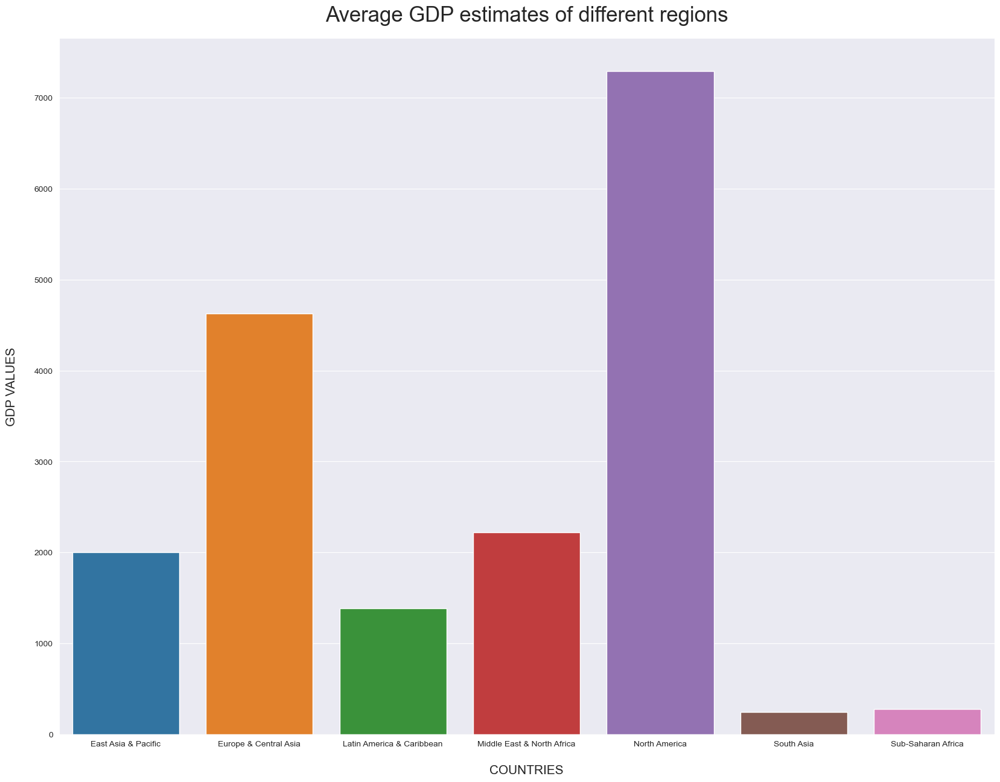

In [33]:
plt.figure(figsize=(20, 15))
sns.color_palette("mako", as_cmap=True)
sns.barplot(data=average_gdp_by_region,
             x="region_name",
             y="gdp_value",
            )
plt.title('Average GDP estimates of different regions', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
plt.show();

### II. Average GDP by Indicators

In [43]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_indicator,on='indicator_id')
average_gdp_by_indicators = merged_df.groupby('indicator_name')['gdp_value'].mean()
average_gdp_by_indicators = average_gdp_by_indicators.to_frame()
average_gdp_by_indicators['indicator_name'] = average_gdp_by_indicators.index
average_gdp_by_indicators = average_gdp_by_indicators.reset_index(drop=True)
average_gdp_by_indicators

,gdp_value,indicator_name
0,3.681001,GDP growth (annual %)
1,8396.011888,GDP per capita (current US$)
2,1.959340,GDP per capita growth (annual %)
3,22.696665,Gross savings (% of GDP)
4,25.018690,"Inflation, GDP deflator (annual %)"


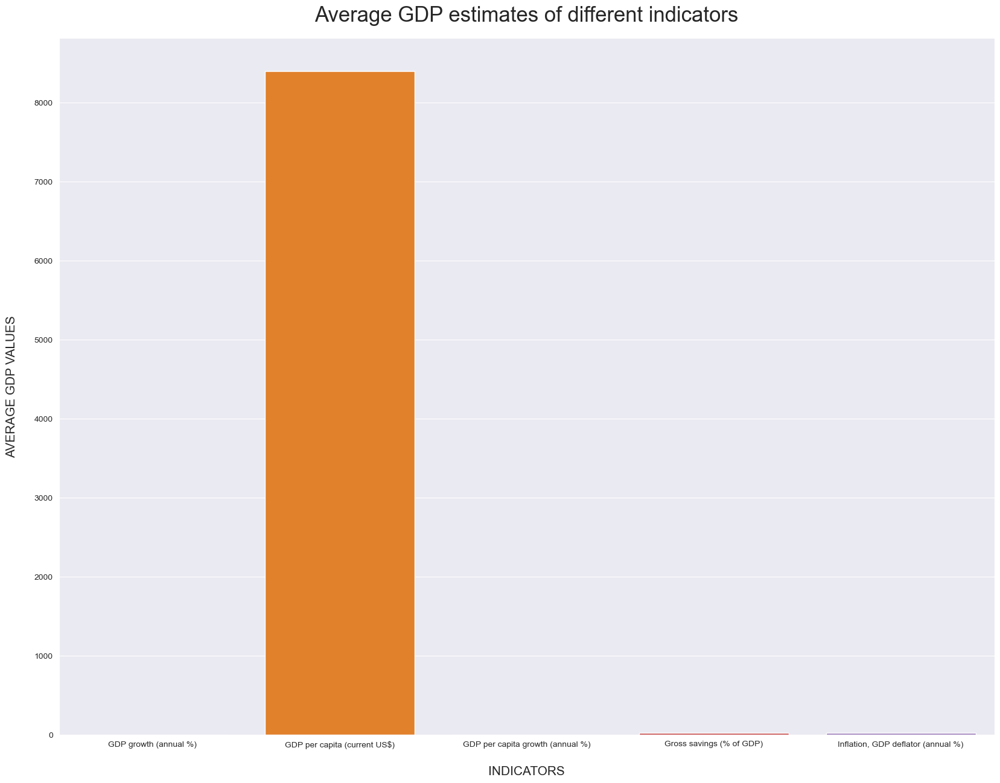

In [46]:
plt.figure(figsize=(20, 15))
sns.color_palette("mako", as_cmap=True)
sns.barplot(data=average_gdp_by_indicators,
             x="indicator_name",
             y="gdp_value",
            )
plt.title('Average GDP estimates of different indicators', fontsize=25, pad=20)
plt.xlabel("INDICATORS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

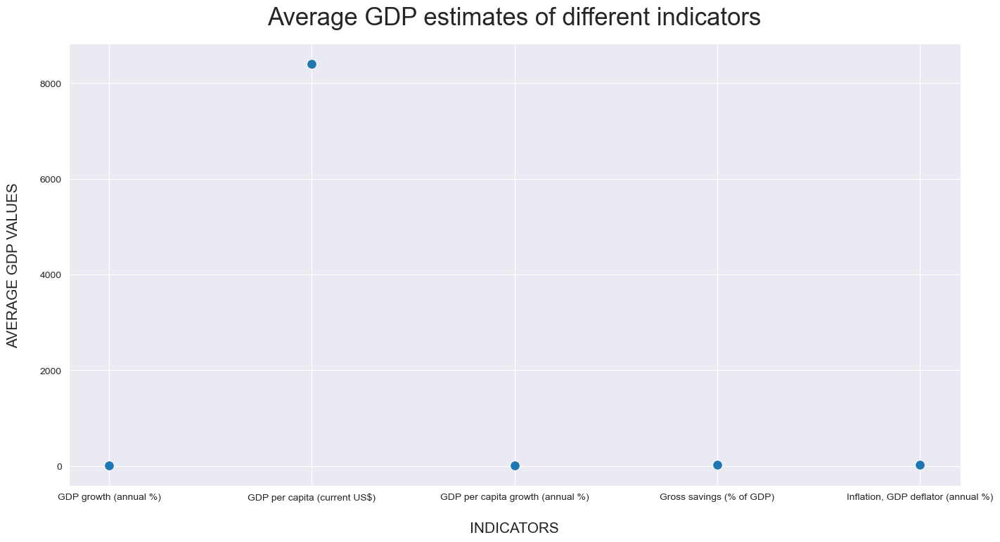

In [47]:
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_indicators,
            x="indicator_name",
            y="gdp_value", 
            height=7, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates of different indicators', fontsize=25, pad=20)
plt.xlabel("INDICATORS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

Dropping the GDP per capita (current US$) to compare values of other indicators.

In [52]:
average_gdp_by_indicators

,gdp_value,indicator_name
0,3.681001,GDP growth (annual %)
1,8396.011888,GDP per capita (current US$)
2,1.959340,GDP per capita growth (annual %)
3,22.696665,Gross savings (% of GDP)
4,25.018690,"Inflation, GDP deflator (annual %)"


In [53]:
average_gdp_by_indicators_new = average_gdp_by_indicators.drop(1)
average_gdp_by_indicators_new

,gdp_value,indicator_name
0,3.681001,GDP growth (annual %)
2,1.959340,GDP per capita growth (annual %)
3,22.696665,Gross savings (% of GDP)
4,25.018690,"Inflation, GDP deflator (annual %)"


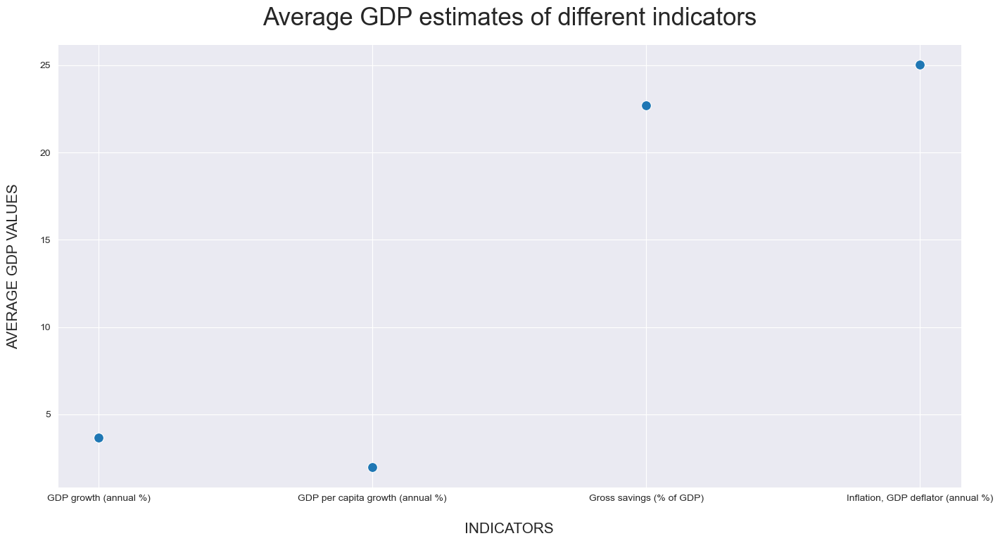

In [54]:
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_indicators_new,
            x="indicator_name",
            y="gdp_value", 
            height=7, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates of different indicators', fontsize=25, pad=20)
plt.xlabel("INDICATORS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

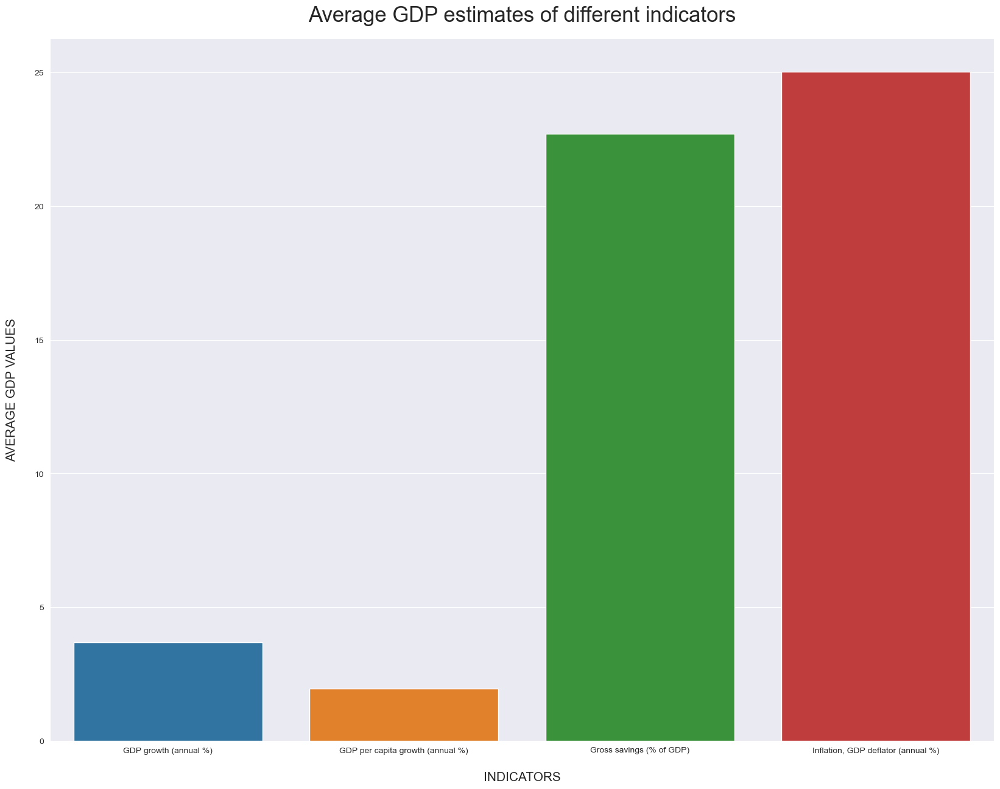

In [55]:
plt.figure(figsize=(20, 15))
sns.color_palette("mako", as_cmap=True)
sns.barplot(data=average_gdp_by_indicators_new,
             x="indicator_name",
             y="gdp_value",
            )
plt.title('Average GDP estimates of different indicators', fontsize=25, pad=20)
plt.xlabel("INDICATORS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

<hr>

### III. Average GDP by Income Groups

In [58]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_income,on='income_id')
average_gdp_by_income = merged_df.groupby('income_group')['gdp_value'].mean()
average_gdp_by_income = average_gdp_by_income.to_frame()
average_gdp_by_income['income_group'] = average_gdp_by_income.index
average_gdp_by_income = average_gdp_by_income.reset_index(drop=True)
average_gdp_by_income

,gdp_value,income_group
0,5172.815277,High income
1,123.583152,Low income
2,275.708669,Lower middle income
3,793.257564,Upper middle income


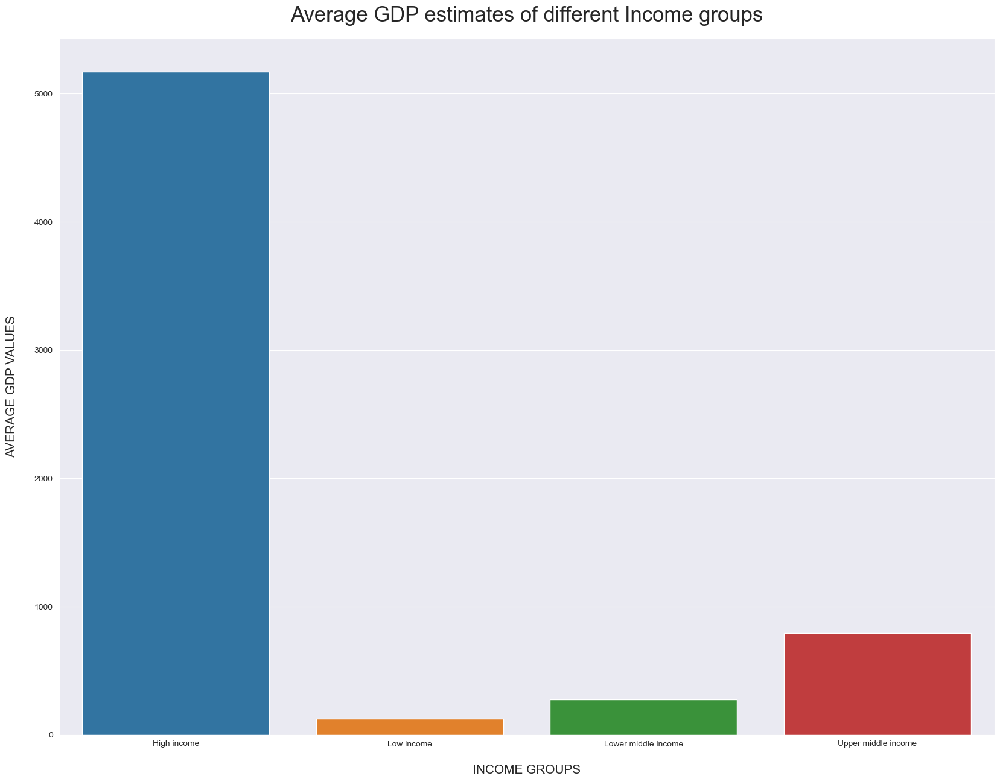

In [59]:
plt.figure(figsize=(20, 15))
sns.color_palette("mako", as_cmap=True)
sns.barplot(data=average_gdp_by_income,
             x="income_group",
            y="gdp_value"
            )
plt.title('Average GDP estimates of different Income groups', fontsize=25, pad=20)
plt.xlabel("INCOME GROUPS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

### IV. Average GDP by Time period

In [60]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_time_period,left_on='year_id',right_on='time_period_id')
average_gdp_by_years = merged_df.groupby('year_')['gdp_value'].mean()
average_gdp_by_years = average_gdp_by_years.to_frame()
average_gdp_by_years['year'] = average_gdp_by_years.index
average_gdp_by_years = average_gdp_by_years.reset_index(drop=True)
average_gdp_by_years

,gdp_value,year
0,3.157895,1960
1,137.051075,1961
2,141.721242,1962
3,150.485421,1963
4,163.781017,1964
...,...,...
58,3662.191055,2018
59,3656.909330,2019
60,3416.411580,2020
61,3858.910468,2021


#### 1. Average GDP estimates over the period of 1960-2022

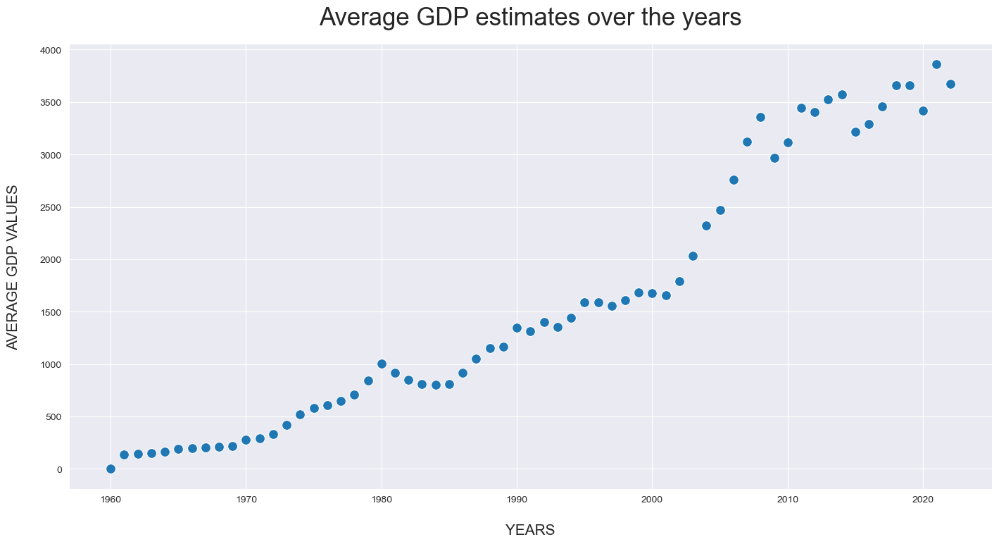

In [62]:
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_years,
            x="year",
            y="gdp_value", 
            height=7, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates over the years', fontsize=25, pad=20)
plt.xlabel("YEARS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

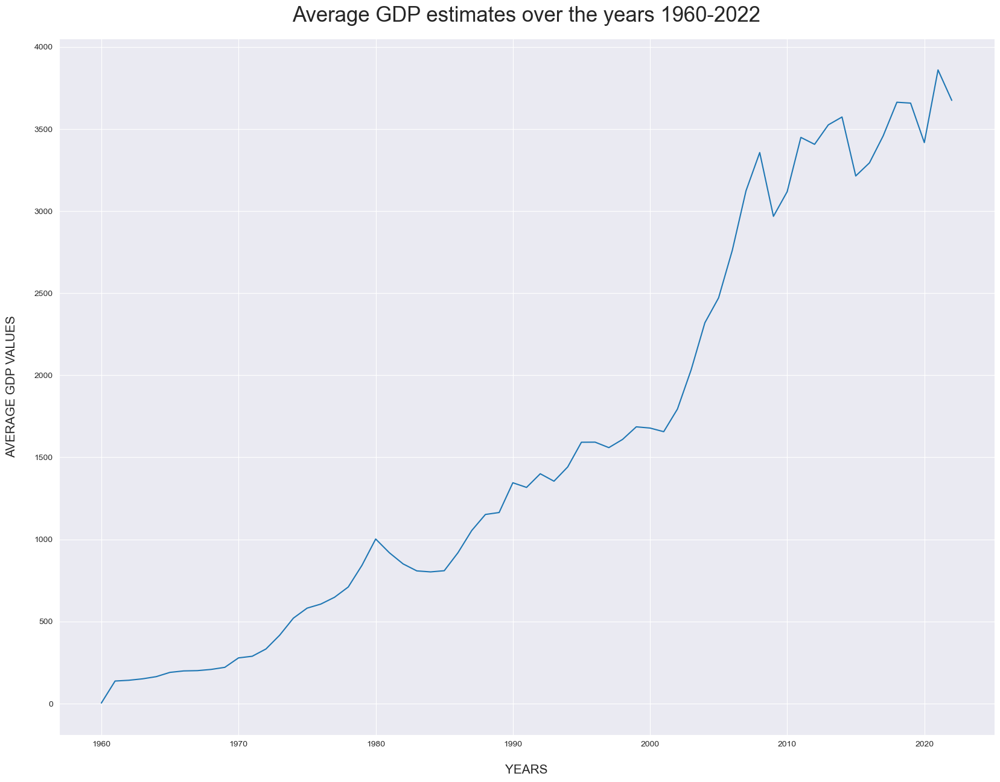

In [63]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=average_gdp_by_years,
             x="year",
             y="gdp_value"
            )
plt.title('Average GDP estimates over the years 1960-2022', fontsize=25, pad=20)
plt.xlabel("YEARS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

#### 2. Average GDP estimates for each decade

In [81]:
def plot_averages(df):
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=df,
                 x="year",
                 y="gdp_value",
                 marker='o',
                 markersize=10,
                 color='black',
                 markerfacecolor='red'
            )
    plt.title(f'Average GDP estimates over the years {df.year[df.index[0]]}-{df.year[df.index[len(df)-1]]}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(df.year)
    plt.show();

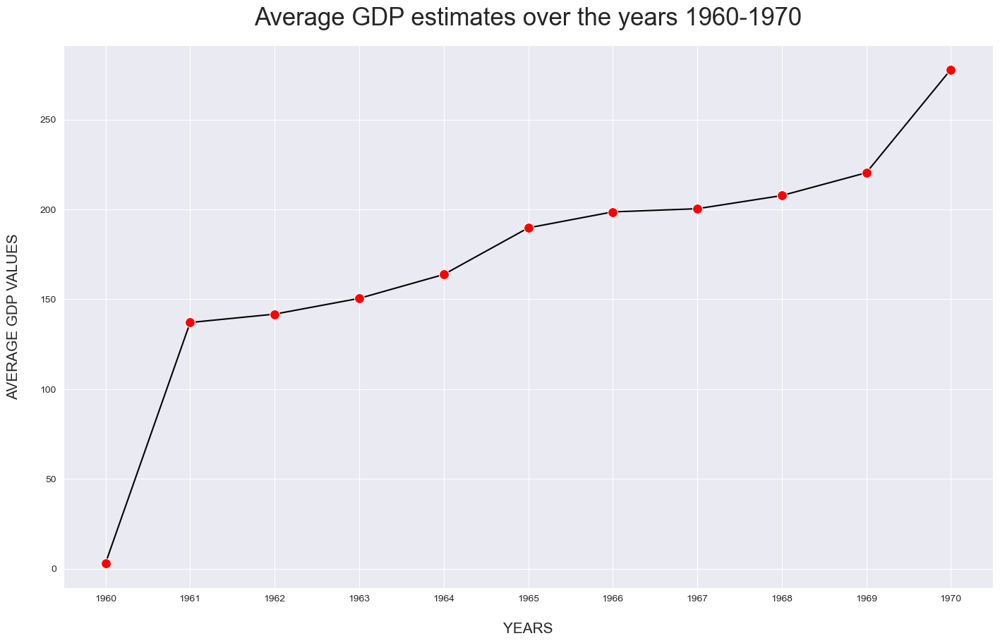

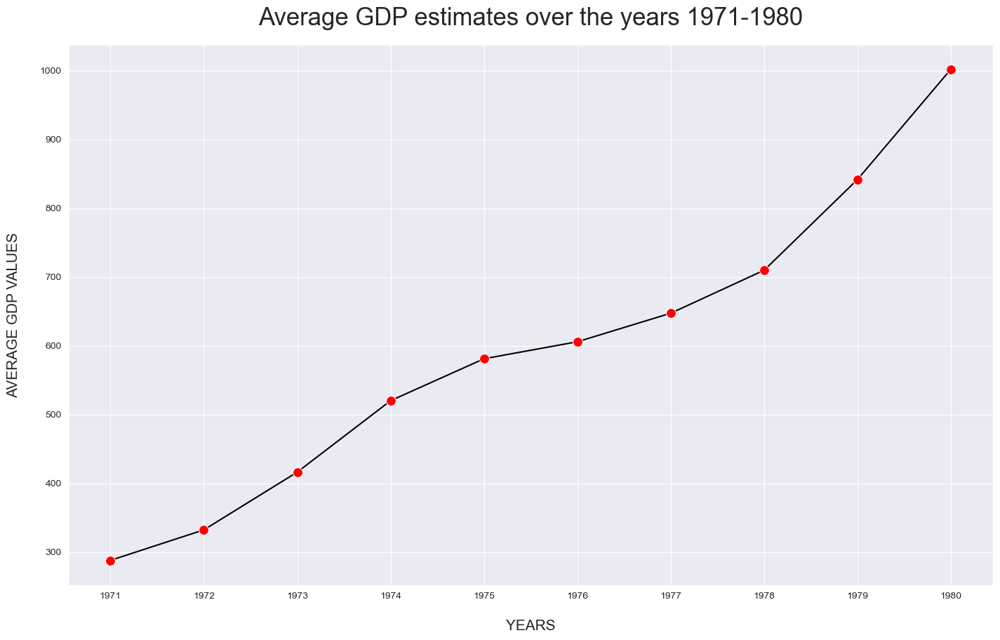

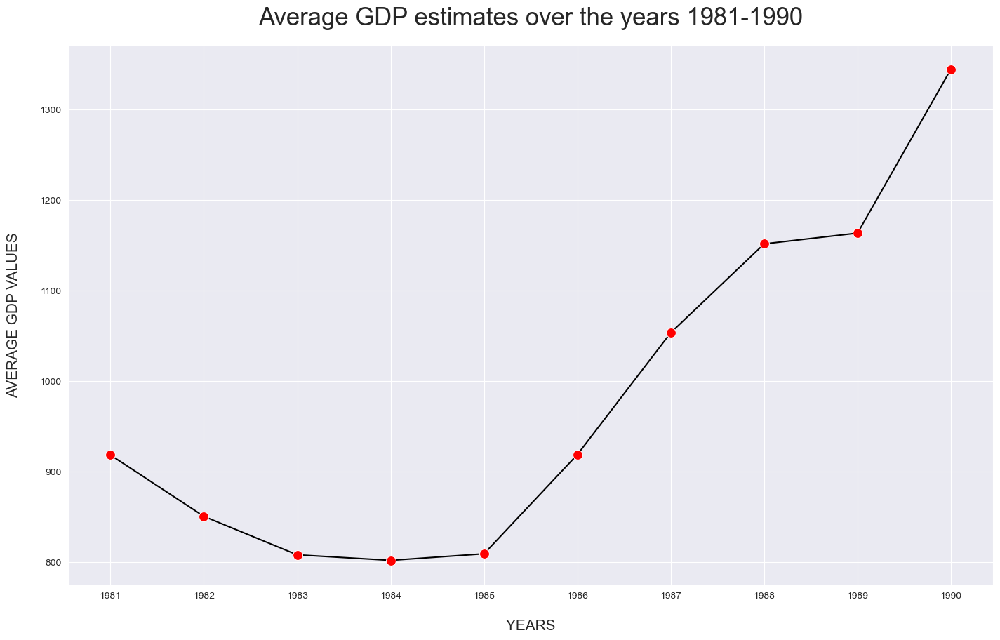

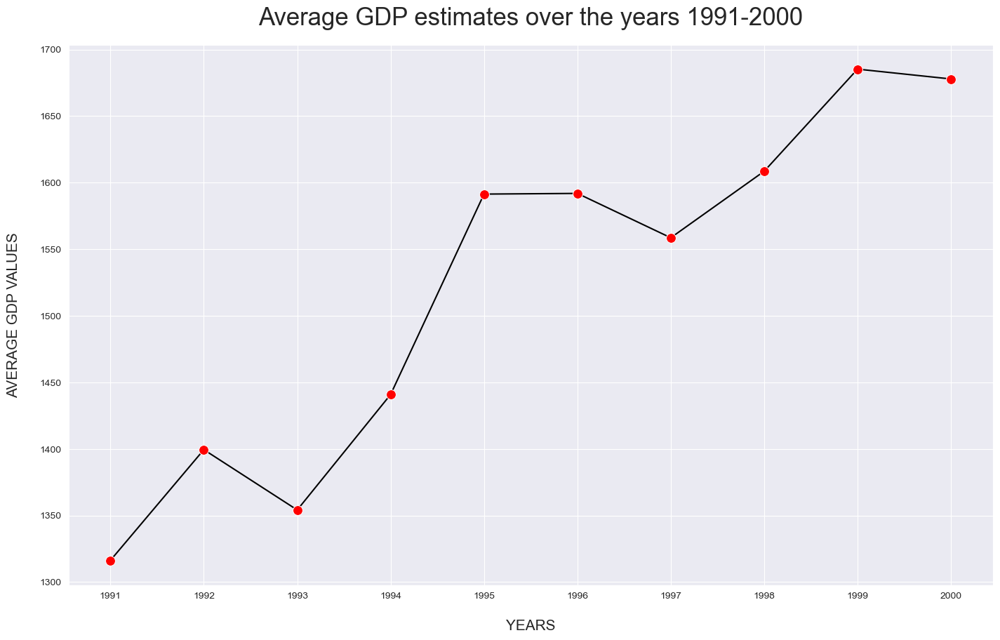

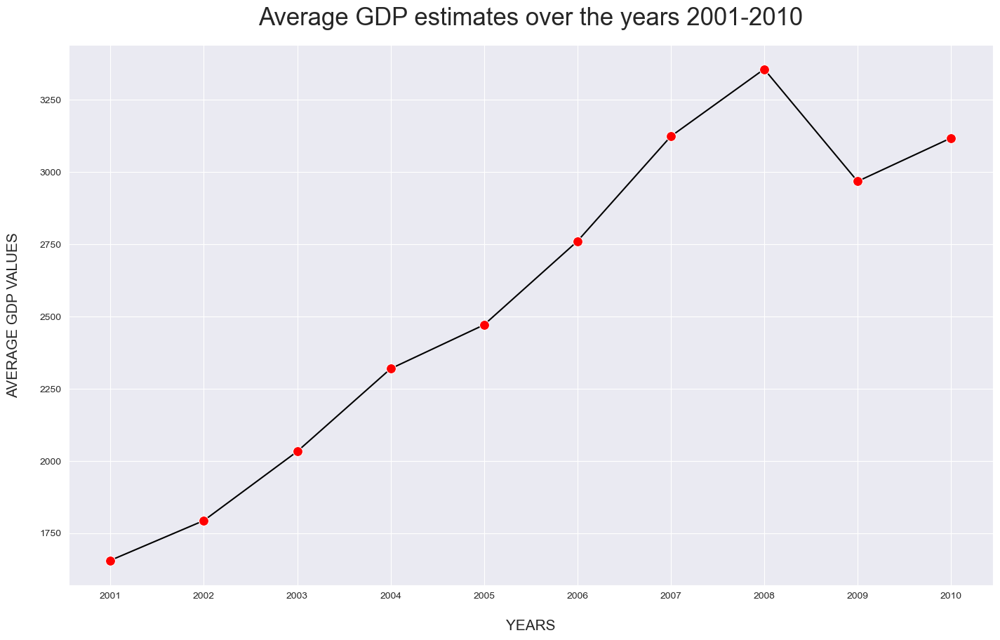

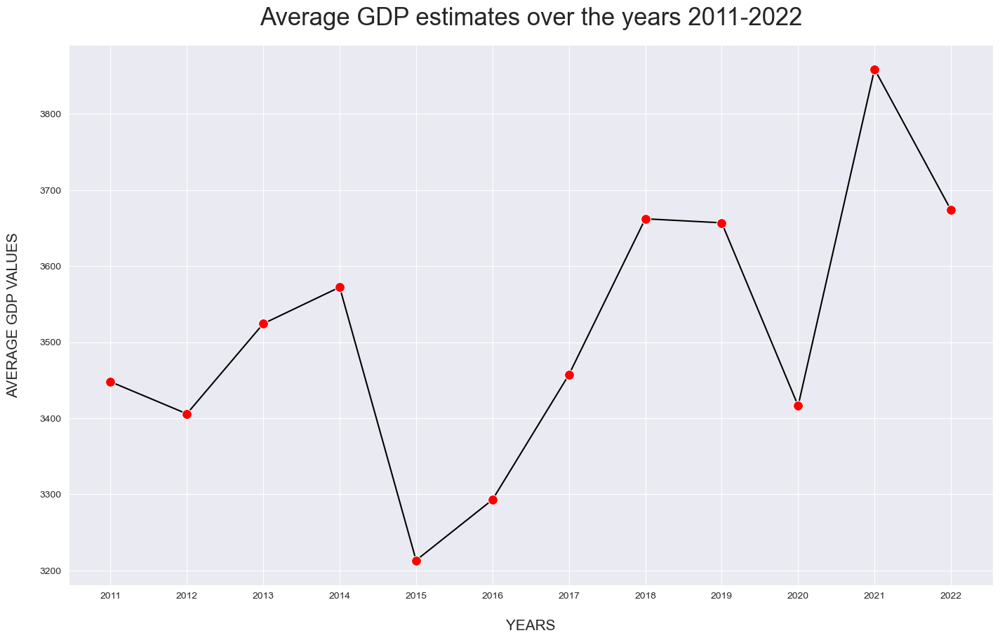

In [82]:
for i in range(0,len(average_gdp_by_years)+1,10):
    if i!=0 and i<50:
        curr_df = average_gdp_by_years[i+1:i+11]
    elif i!=0 and i>50:
        continue
    elif i!=0:
        curr_df = average_gdp_by_years[i+1:len(average_gdp_by_years)]
    else:
        curr_df = average_gdp_by_years[i:i+11]
    plot_averages(curr_df)

### Conclusions:

<h3 style="color:green;">Decade of consistent growth : 1971 to 1980</h3>

<h1 style="color:red;">INCOMPLETE (above and below) </h1>

### COVID Period

### V. Average GDP by Countries

In [83]:
df_dim_country

,country_id,country_code,country_name,special_notes,region_id,income_id
0,1,ABW,Aruba,None,3.0,1.0
1,2,AFE,Africa Eastern and Southern,"26 countries, stretching from the Red Sea in t...",NaN,NaN
2,3,AFG,Afghanistan,The reporting period for national accounts dat...,6.0,2.0
3,4,AFW,Africa Western and Central,"22 countries, stretching from the westernmost ...",NaN,NaN
4,5,AGO,Angola,The World Bank systematically assesses the app...,7.0,3.0
...,...,...,...,...,...,...
260,261,XKX,Kosovo,None,2.0,4.0
261,262,YEM,"Yemen, Rep.",The World Bank systematically assesses the app...,4.0,2.0
262,263,ZAF,South Africa,Fiscal year end: March 31; reporting period fo...,7.0,4.0
263,264,ZMB,Zambia,National accounts data were rebased to reflect...,7.0,3.0


In [84]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
average_gdp_by_countries = merged_df.groupby('country_code')['gdp_value'].mean()
average_gdp_by_countries = average_gdp_by_countries.to_frame()
average_gdp_by_countries

,gdp_value
country_code,
ABW,4596.847125
AFE,190.384892
AFG,129.049165
AFW,182.625726
AGO,455.306737
...,...
XKX,818.488919
YEM,217.675467
ZAF,723.728259


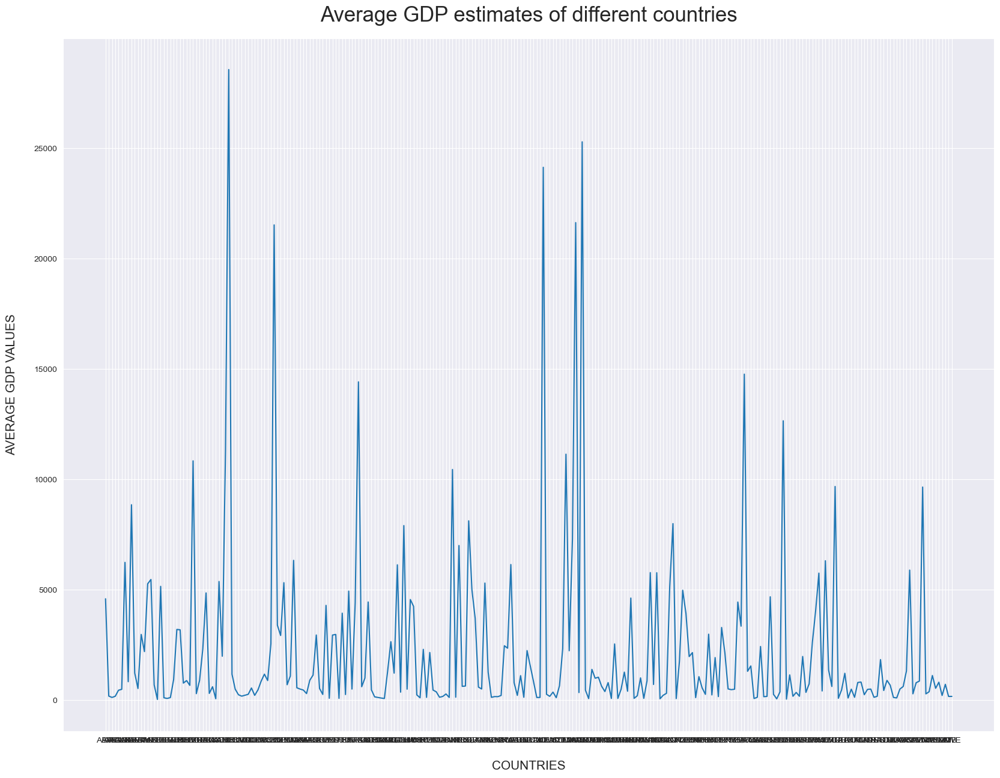

In [85]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=average_gdp_by_countries,
             x="country_code",
             y="gdp_value",
            )
plt.title('Average GDP estimates of different countries', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

#### Region-wise

In [86]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name']],on='country_id')
merged_df

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name
0,1,1,28,3.0,1.0,1,3.591970,ABW,Aruba
1,2,1,29,3.0,1.0,1,3.108439,ABW,Aruba
2,3,1,30,3.0,1.0,1,3.962543,ABW,Aruba
3,4,1,31,3.0,1.0,1,5.769870,ABW,Aruba
4,5,1,32,3.0,1.0,1,5.614860,ABW,Aruba
...,...,...,...,...,...,...,...,...,...
59069,59072,5,59,7.0,3.0,265,13.923906,ZWE,Zimbabwe
59070,59073,5,60,7.0,3.0,265,20.231198,ZWE,Zimbabwe
59071,59074,5,61,7.0,3.0,265,16.452763,ZWE,Zimbabwe
59072,32848,3,52,3.0,1.0,147,21344.590320,MAF,St. Martin (French part)


In [87]:
average_gdp_by_countries = merged_df.groupby(['country_code','region_id'])['gdp_value'].mean()
average_gdp_by_countries = average_gdp_by_countries.to_frame()
average_gdp_by_countries

,,gdp_value
country_code,region_id,
ABW,3.0,4596.847125
AFG,6.0,129.049165
AGO,7.0,455.306737
ALB,2.0,496.685546
AND,2.0,6245.746607
...,...,...
XKX,2.0,818.488919
YEM,4.0,217.675467
ZAF,7.0,723.728259


In [94]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name']],on='country_id')
average_gdp_by_countries = merged_df.groupby(['country_code'])['gdp_value'].mean()
average_gdp_by_countries = average_gdp_by_countries.to_frame()
average_gdp_by_countries['country_code'] = average_gdp_by_countries.index
average_gdp_by_countries = average_gdp_by_countries.reset_index(drop=True)

In [95]:
average_gdp_by_countries

,gdp_value,country_code
0,4596.847125,ABW
1,190.384892,AFE
2,129.049165,AFG
3,182.625726,AFW
4,455.306737,AGO
...,...,...
257,818.488919,XKX
258,217.675467,YEM
259,723.728259,ZAF
260,173.633306,ZMB


In [96]:
average_gdp_by_countries = pd.merge(average_gdp_by_countries,df_dim_country[['country_code','country_id','country_name','region_id']],on='country_code')
average_gdp_by_countries

,gdp_value,country_code,country_id,country_name,region_id
0,4596.847125,ABW,1,Aruba,3.0
1,190.384892,AFE,2,Africa Eastern and Southern,NaN
2,129.049165,AFG,3,Afghanistan,6.0
3,182.625726,AFW,4,Africa Western and Central,NaN
4,455.306737,AGO,5,Angola,7.0
...,...,...,...,...,...
257,818.488919,XKX,261,Kosovo,2.0
258,217.675467,YEM,262,"Yemen, Rep.",4.0
259,723.728259,ZAF,263,South Africa,7.0
260,173.633306,ZMB,264,Zambia,7.0


In [98]:
average_gdp_by_countries = pd.merge(average_gdp_by_countries,df_dim_regions,on='region_id')
average_gdp_by_countries

,gdp_value,country_code,country_id,country_name,region_id,region_name
0,4596.847125,ABW,1,Aruba,3.0,Latin America & Caribbean
1,1238.866011,ARG,10,Argentina,3.0,Latin America & Caribbean
2,2206.209989,ATG,13,Antigua and Barbuda,3.0,Latin America & Caribbean
3,3192.218291,BHS,24,"Bahamas, The",3.0,Latin America & Caribbean
4,675.322216,BLZ,27,Belize,3.0,Latin America & Caribbean
...,...,...,...,...,...,...
209,387.457028,VUT,258,Vanuatu,1.0,East Asia & Pacific
210,543.106523,WSM,260,Samoa,1.0,East Asia & Pacific
211,10843.049702,BMU,28,Bermuda,5.0,North America
212,5380.265005,CAN,36,Canada,5.0,North America


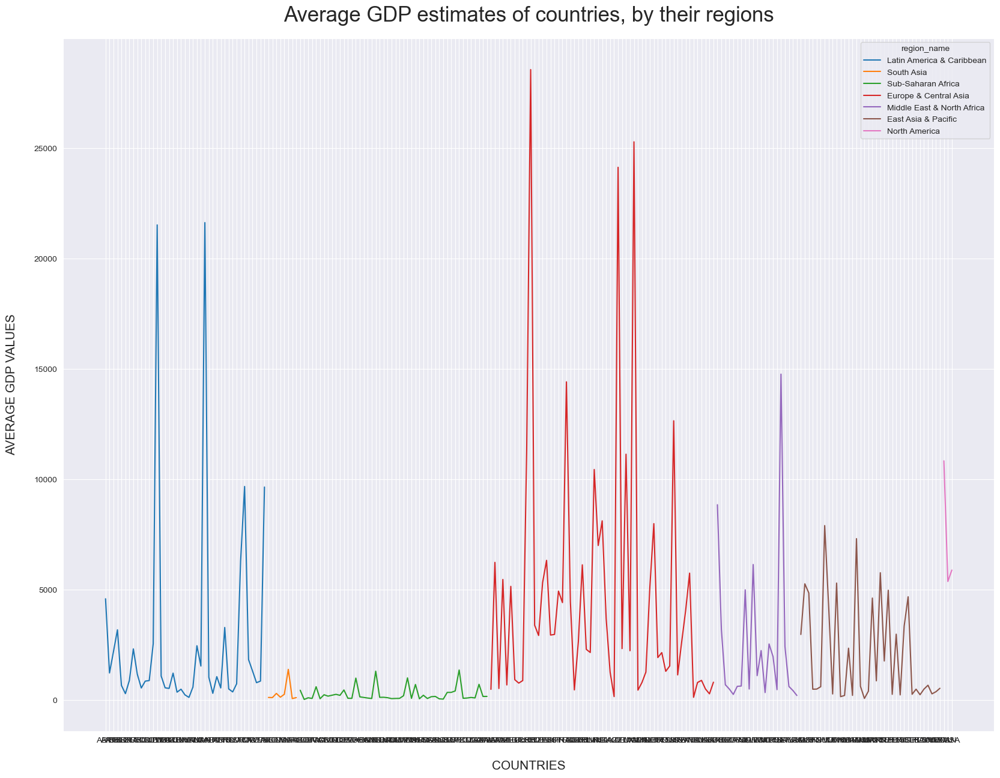

In [99]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=average_gdp_by_countries,
             x="country_code",
             y="gdp_value",
             hue="region_name"
            )
plt.title('Average GDP estimates of countries, by their regions', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

<center><h1 style="color:blue;">Analytics Part 2 : Maximum</h1></center>

In [130]:
df = pd.merge(df_fact,
        df_dim_country[['country_id','country_code','country_name']],
        on='country_id')

In [131]:
df = pd.merge(df,
        df_dim_income,
        on='income_id')

In [132]:
df = pd.merge(df,
        df_dim_indicator,
        on='indicator_id')

In [133]:
df = pd.merge(df,
        df_dim_regions,
        on='region_id')

In [134]:
df = pd.merge(df,
        df_dim_time_period,
        left_on='year_id',right_on='time_period_id')
df = df.drop(columns=['time_period_id'])

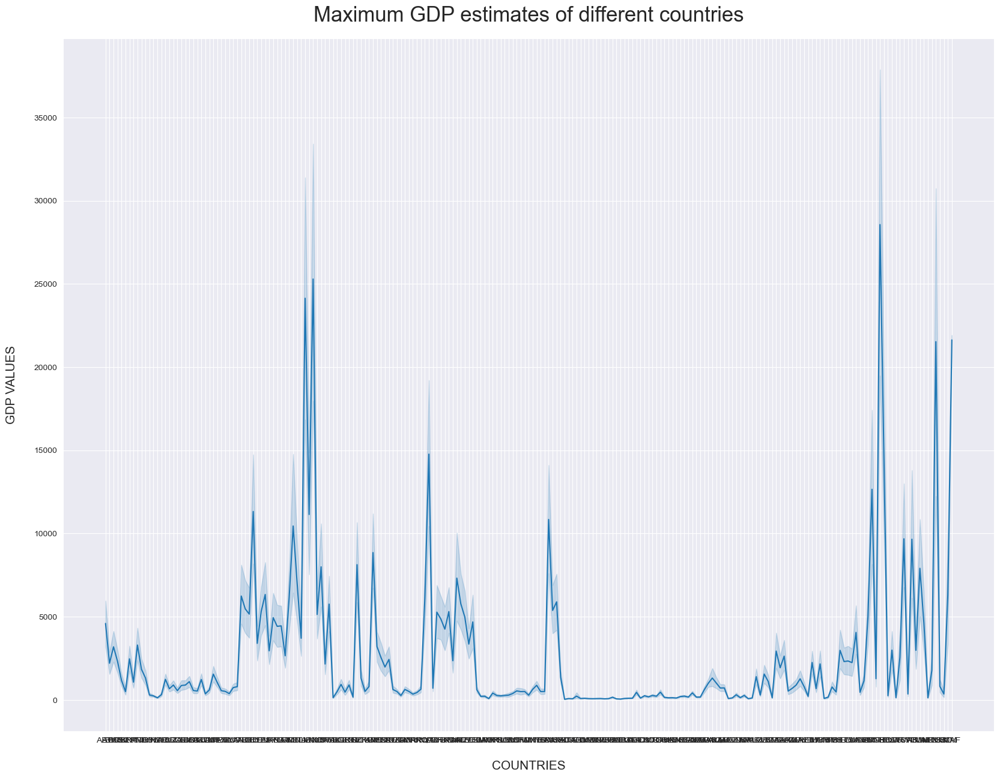

In [135]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=df,
             x="country_code",
             y="gdp_value"
            )
plt.title('Maximum GDP estimates of different countries', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
plt.show();

In [136]:
df_top_10 = df.sort_values(by=['gdp_value'], ascending=False)

In [137]:
df_top_10 = df_top_10[0:10:1]

In [138]:
df_top_10

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
31275,32964,3,62,2.0,1.0,149,234317.0848,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
18384,32951,3,49,2.0,1.0,149,204097.2100,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2008
29307,32962,3,60,2.0,1.0,149,199382.7812,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2019
24313,32957,3,55,2.0,1.0,149,195772.6730,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014
28311,32961,3,59,2.0,1.0,149,194287.0933,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2018
23321,32956,3,54,2.0,1.0,149,185055.4874,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2013
17414,32950,3,48,2.0,1.0,149,184626.7292,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2007
31271,32372,3,62,2.0,1.0,137,184083.3214,LIE,Liechtenstein,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
30299,32963,3,61,2.0,1.0,149,182537.3046,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2020
24309,32365,3,55,2.0,1.0,137,179467.5069,LIE,Liechtenstein,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014


### I. Top 10 GDP performances

'Inflation, GDP deflator (annual %)'

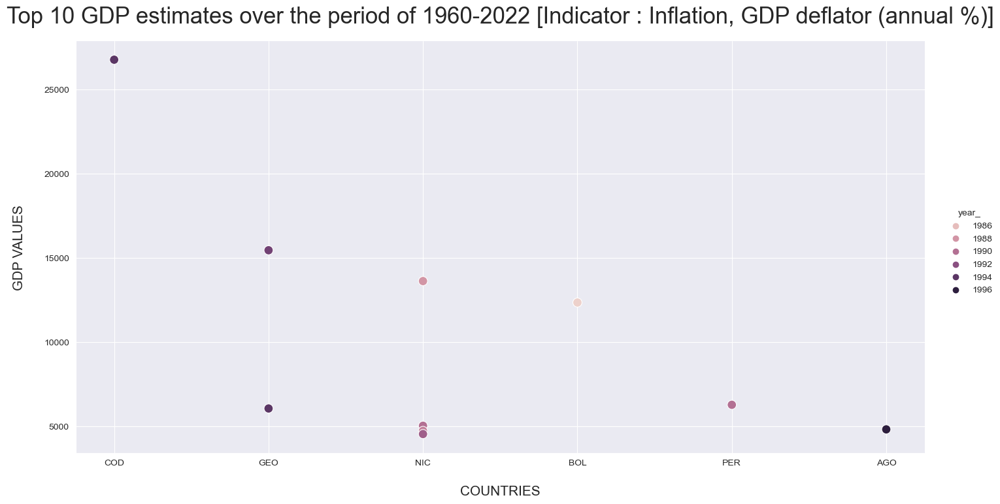

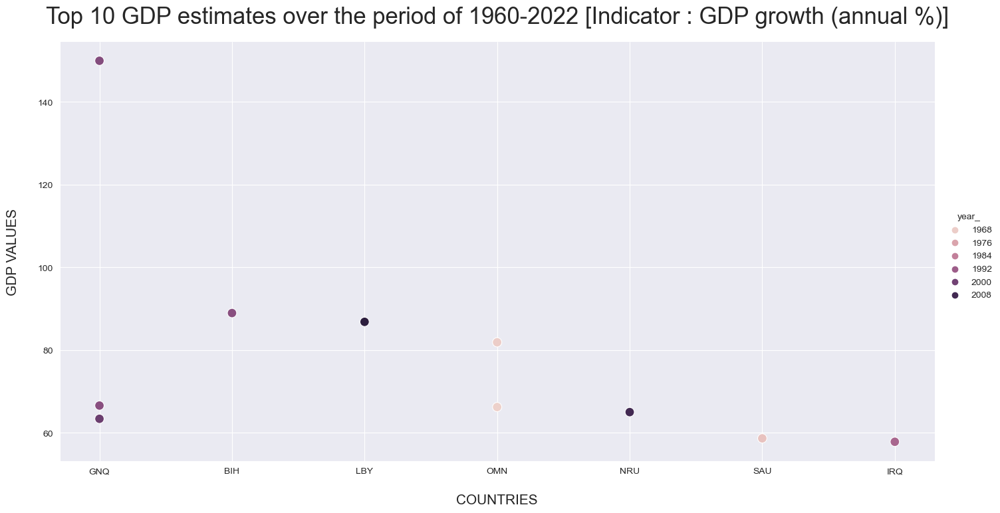

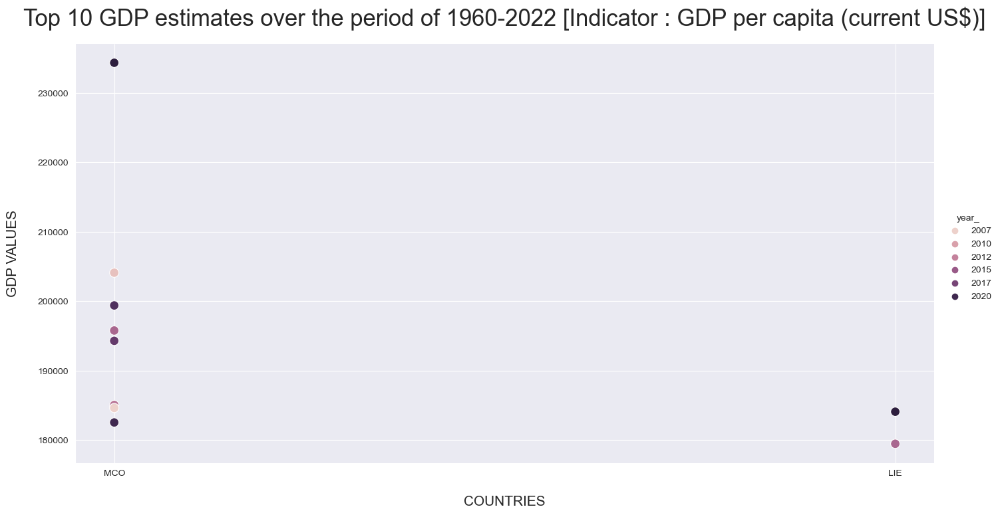

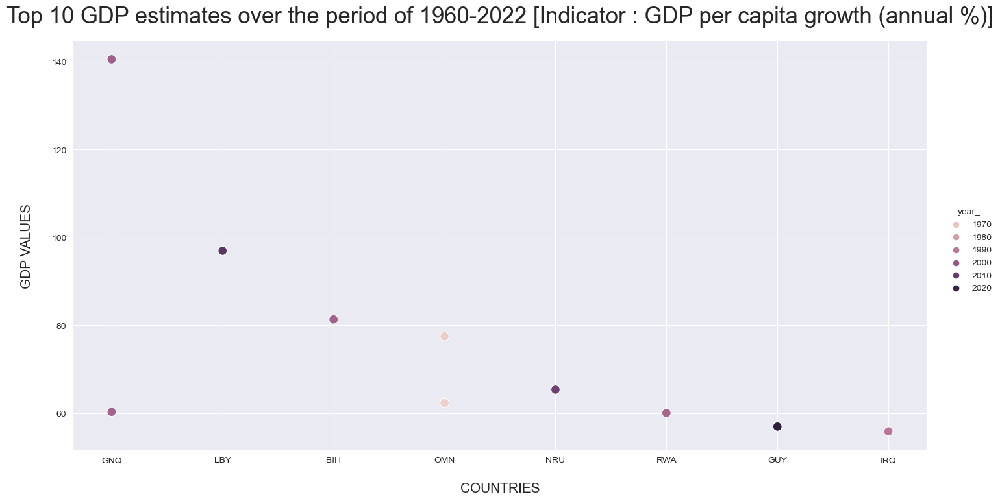

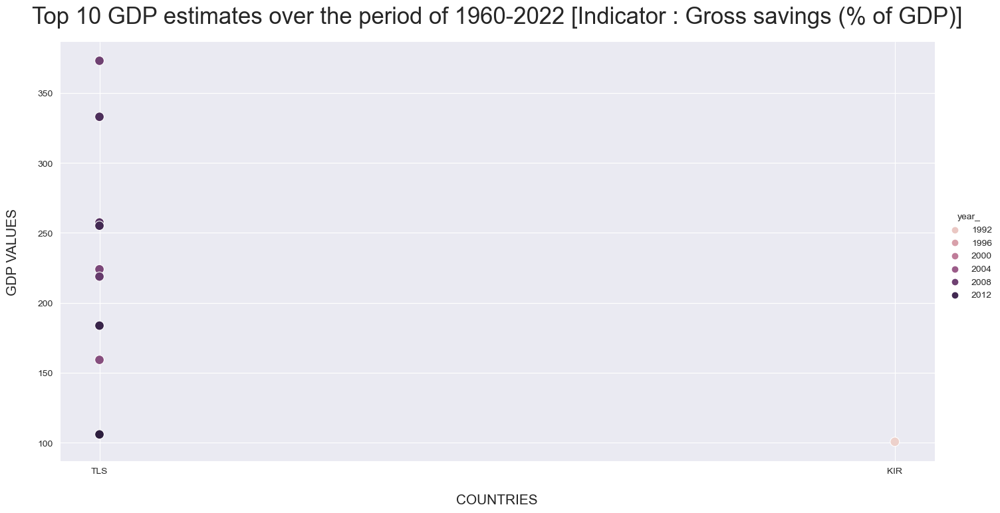

In [171]:
for i in range(1,6):
    df_top10_ind = df[df['indicator_id']==i].sort_values(by=['gdp_value'], ascending=False)
    df_top10_ind = df_top10_ind[0:10:1]

    sns.set_style("darkgrid")
    sns.relplot(data=df_top10_ind,
                     x="country_code",
                     y="gdp_value" ,
                hue="year_",
                height=7, 
                aspect=2, 
                s=100 # Increase marker size 
               )
    ind = df_dim_indicator[df_dim_indicator['indicator_id']==i]['indicator_name'][i-1]    
    plt.title(f'Top 10 GDP estimates over the period of 1960-2022 [Indicator : {ind}]', fontsize=25, pad=20)
    plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.show();

### Top 10 Countries (based in individual GDP over 1960-2022)

In [174]:
df_sorted = df.sort_values(by=['gdp_value'], ascending=False)

In [175]:
df_sorted.groupby(['country_code'])['gdp_value'].max()

country_code
ABW    31902.762580
AFG      663.141053
AGO     5101.983876
ALB     6802.804519
AND    53721.411330
           ...     
XKX     5351.439542
YEM     1557.601406
ZAF     8737.041110
ZMB     1840.320553
ZWE     2269.177012
Name: gdp_value, Length: 213, dtype: float64

In [176]:
df_sorted

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
31275,32964,3,62,2.0,1.0,149,234317.084800,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
18384,32951,3,49,2.0,1.0,149,204097.210000,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2008
29307,32962,3,60,2.0,1.0,149,199382.781200,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2019
24313,32957,3,55,2.0,1.0,149,195772.673000,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014
28311,32961,3,59,2.0,1.0,149,194287.093300,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33500,57583,5,21,1.0,3.0,209,-125.985178,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1980
35471,57586,5,24,1.0,3.0,209,-125.999407,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1983
36158,57587,5,25,1.0,3.0,209,-126.013827,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1984
34792,57585,5,23,1.0,3.0,209,-128.956792,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1982


In [177]:
df[df['country_code']=='AFG'].sort_values(by=['gdp_value'], ascending=False)

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
22981,25468,3,53,6.0,2.0,3,663.141053,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2012
23972,25469,3,54,6.0,2.0,3,651.987862,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2013
24973,25470,3,55,6.0,2.0,3,628.146804,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2014
21991,25467,3,52,6.0,2.0,3,621.912414,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2011
25974,25471,3,56,6.0,2.0,3,592.476165,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15171,38804,4,45,6.0,2.0,3,-2.497255,AFG,Afghanistan,Low income,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",South Asia,2004
21999,38811,4,52,6.0,2.0,3,-3.211364,AFG,Afghanistan,Low income,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",South Asia,2011
30954,38820,4,61,6.0,2.0,3,-5.364666,AFG,Afghanistan,Low income,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",South Asia,2020
31893,12721,2,62,6.0,2.0,3,-20.700000,AFG,Afghanistan,Low income,NY.GDP.MKTP.KD.ZG,GDP growth (annual %),Annual percentage growth rate of GDP at market...,"World Bank national accounts data, and OECD Na...",South Asia,2021


In [178]:
df_top_10_countries = df_sorted.groupby(
    ['country_code'])[['year_', 'gdp_value']].apply(lambda x: x.loc[x['gdp_value'].idxmax()])

df_top_10_countries = df_top_10_countries.sort_values(by=['gdp_value'],ascending=False)[0:10]
df_top_10_countries['country_code'] = df_top_10_countries.index
df_top_10_countries = df_top_10_countries.reset_index(drop=True)
df_top_10_countries

,year_,gdp_value,country_code
0,2021.0,234317.08480,MCO
1,2021.0,184083.32140,LIE
2,2021.0,133590.14700,LUX
3,2022.0,118845.62110,BMU
4,2022.0,106148.77860,NOR
5,2022.0,104038.94610,IRL
6,2012.0,98041.36224,QAT
7,2022.0,92101.46974,CHE
8,2014.0,91881.12836,IMN
9,2014.0,90873.60249,MAC


<h1 style="color:red;"> Do this Indicators wise </h1>

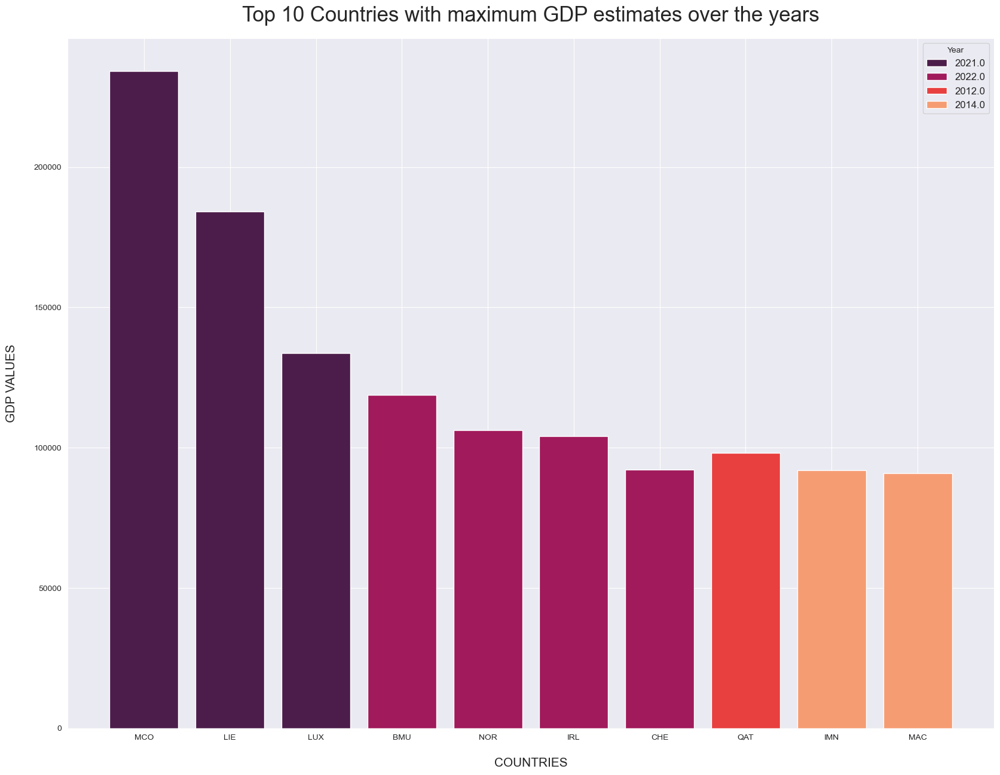

In [179]:
years = df_top_10_countries['year_'].unique().tolist()
colors = sns.color_palette("rocket", len(years))
color_dict = dict(zip(years, colors))
plt.figure(figsize=(20, 15))
for i, year in enumerate(years):
    year_data = df_top_10_countries[df_top_10_countries['year_'] == year]
    plt.bar(year_data['country_code'], year_data['gdp_value'], color=color_dict[year], label=year)
plt.legend(title='Year', fontsize=12)
plt.title('Top 10 Countries with maximum GDP estimates over the years', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
plt.show()

### Yearly top Countries, Income groups & Regions with maximum GDP estimates for every indicator. Analyzed over each decade. [INCOMPLETE]

- Countries (done)
- Income groups (done)
- Regions (done)

In [208]:
def plot_maxgdps_years_decade_wise(s,start,end):
    #general plot of the decade
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=s,
                x='year',
                y='gdp_value',
                marker='o',
                color='black',
                markerfacecolor='red',
                markersize=10)
    plt.title(f'Maximum GDP estimates over the decade {s.year[start]}-{s.year[end]}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("MAX GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(s.year)
    plt.show();

    #country-wise
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=s,
                x='year',
                y='gdp_value',
                hue='country_code',
                marker='o',
                markersize=10)
    plt.title(f'Maximum GDP estimates over the decade {s.year[start]}-{s.year[end]} (Country)', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("MAX GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(s.year)
    plt.show();  
    
    #income-wise
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=s,
                x='year',
                y='gdp_value',
                hue='income_group',
                marker='o',
                markersize=10)
    plt.title(f'Maximum GDP estimates over the decade {s.year[start]}-{s.year[end]} (Income group)', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("MAX GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(s.year)
    plt.show();  
    
    #region-wise
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=s,
                x='year',
                y='gdp_value',
                hue='region_name',
                marker='o',
                markersize=10)
    plt.title(f'Maximum GDP estimates over the decade {s.year[start]}-{s.year[end]} (Region)', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("MAX GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(s.year)
    plt.show(); 

In [209]:
def plot_general_graphs(i,df): #indicator, dataframe
    #BAR GRAPH
    plt.figure(figsize=(20, 15))
    sns.barplot(data=df,
                x="year",
                y="gdp_value",
                palette = sns.color_palette("rocket"),
               )
    plt.title(f'GDP estimates over the years 1960 - 2022 for Indicator {i}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.show();
    
    #LINE CHART
    plt.figure(figsize=(20, 15))
    sns.lineplot(data=df,
                x="year",
                y="gdp_value",
                color="black"
                )
    plt.title(f'GDP estimates over the years 1960 - 2022 for Indicator {i}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.show();
    
    #DECADE-WISE VISUALIZATION
    #if 1961 is the start
    if df.year[0] == 1961:
        for i in range(0,len(df)+1,10):
            if i!=0 and i<50:
                curr_df = df[i:i+10]        
                plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])

            elif i!=0 and i>50:
                continue
            elif i!=0:        
                curr_df = df[i:len(df)]
                plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])
            else:
                curr_df = df[i:i+10]
                plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])
    else:              
        for i in range(0,len(df)+1,10):
            if i!=0 and i<50:
                curr_df = df[i+1:i+11]
            elif i!=0 and i>50:
                continue
            elif i!=0:
                curr_df = df[i+1:len(df)]
            else:
                curr_df = df[i:i+11]
            plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])    

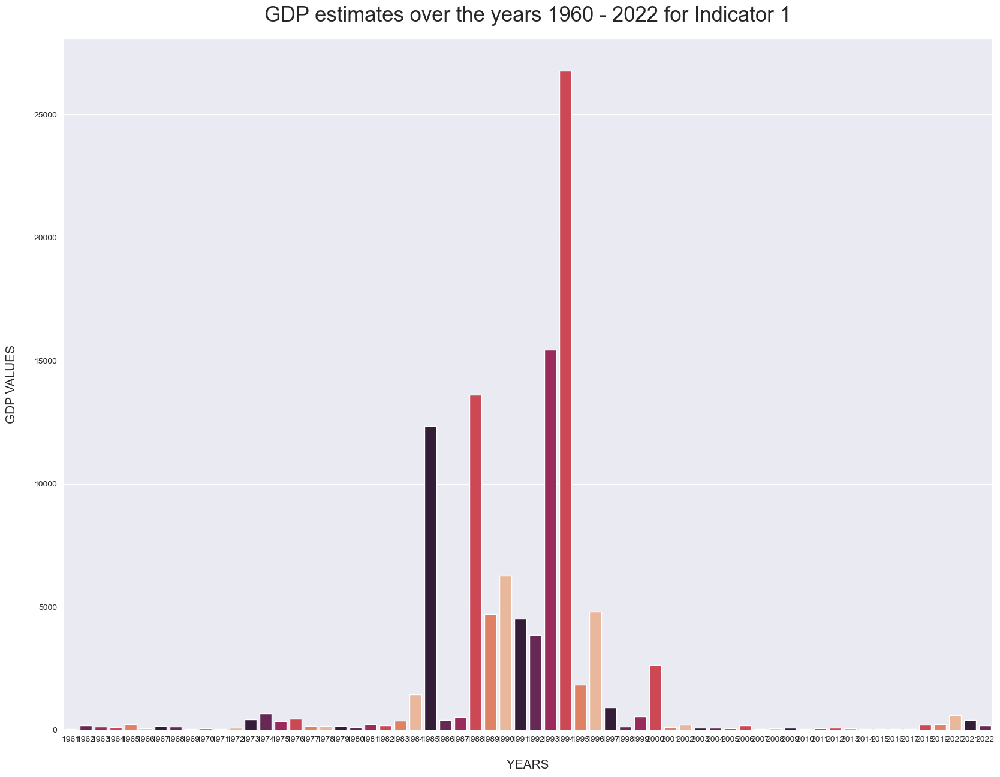

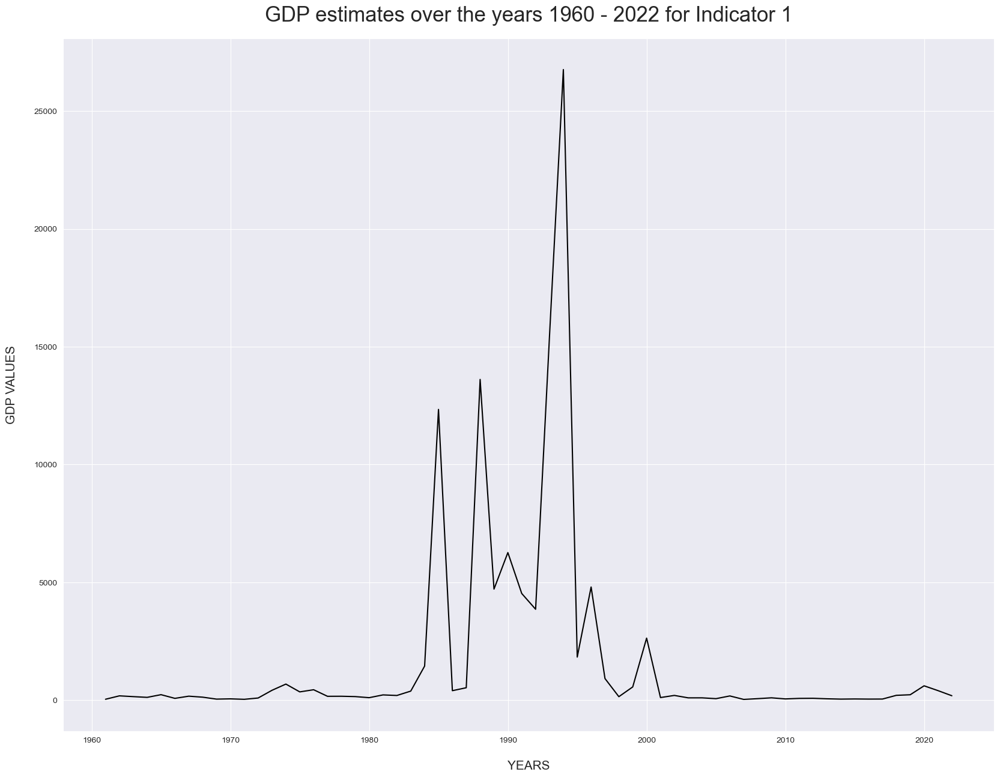

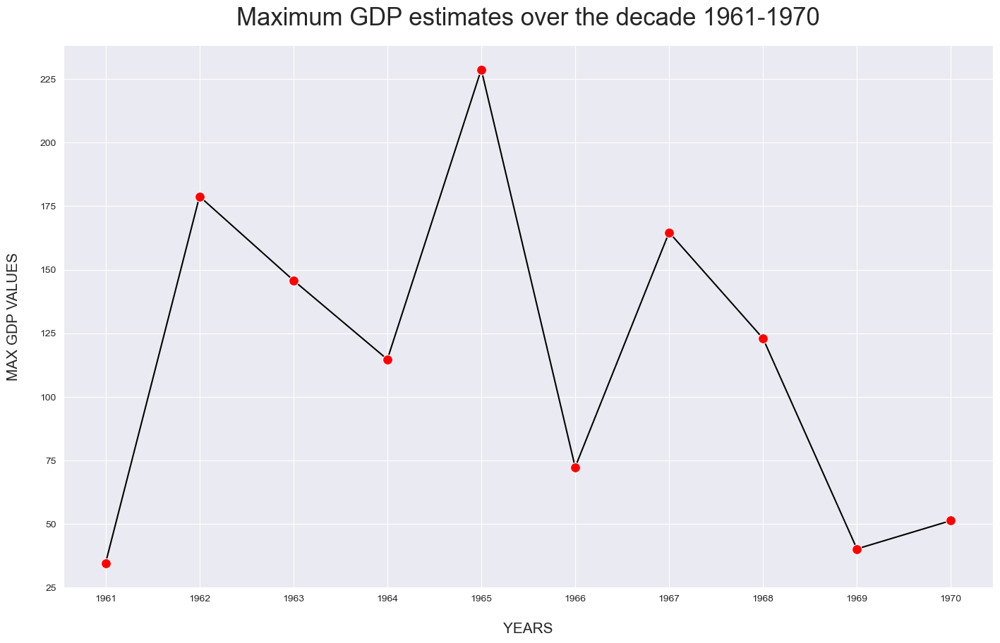

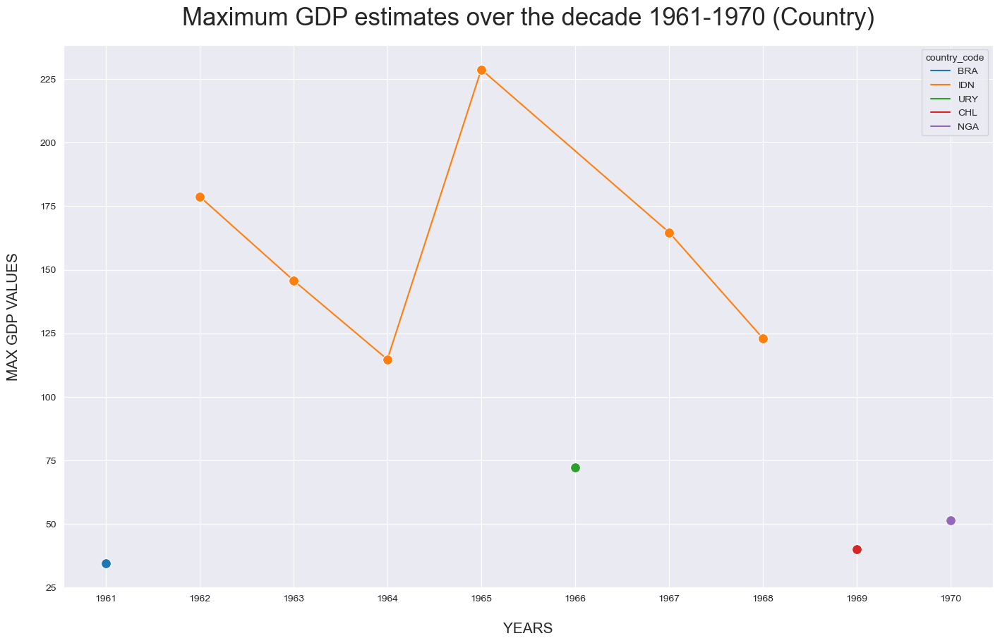

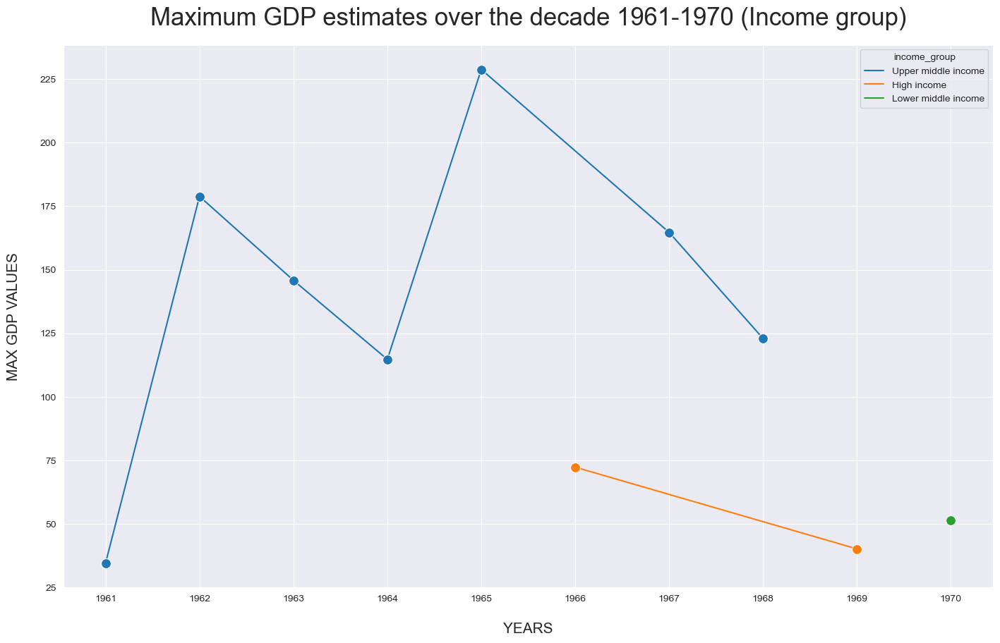

...

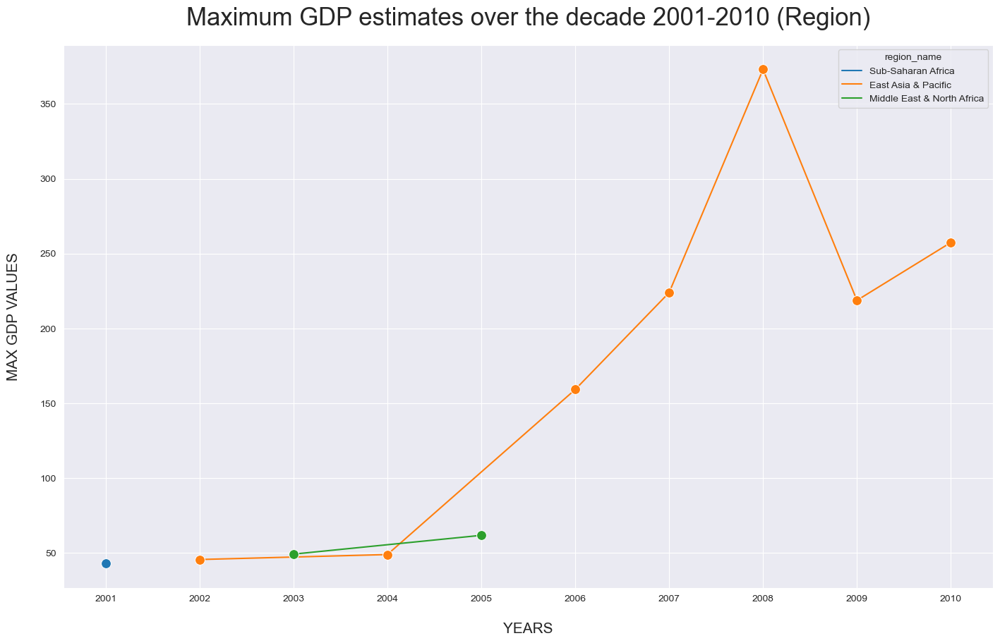

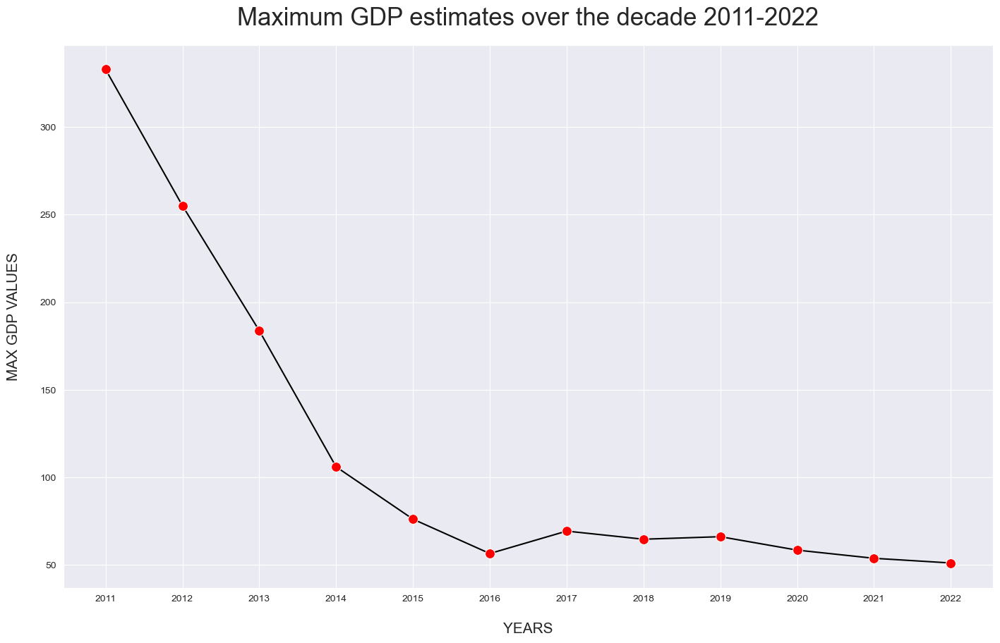

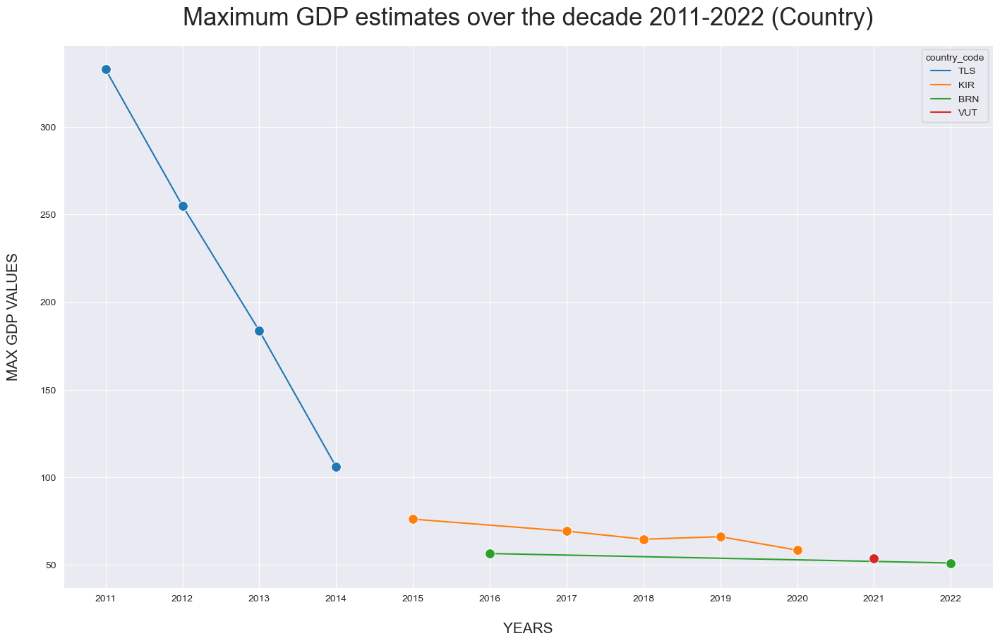

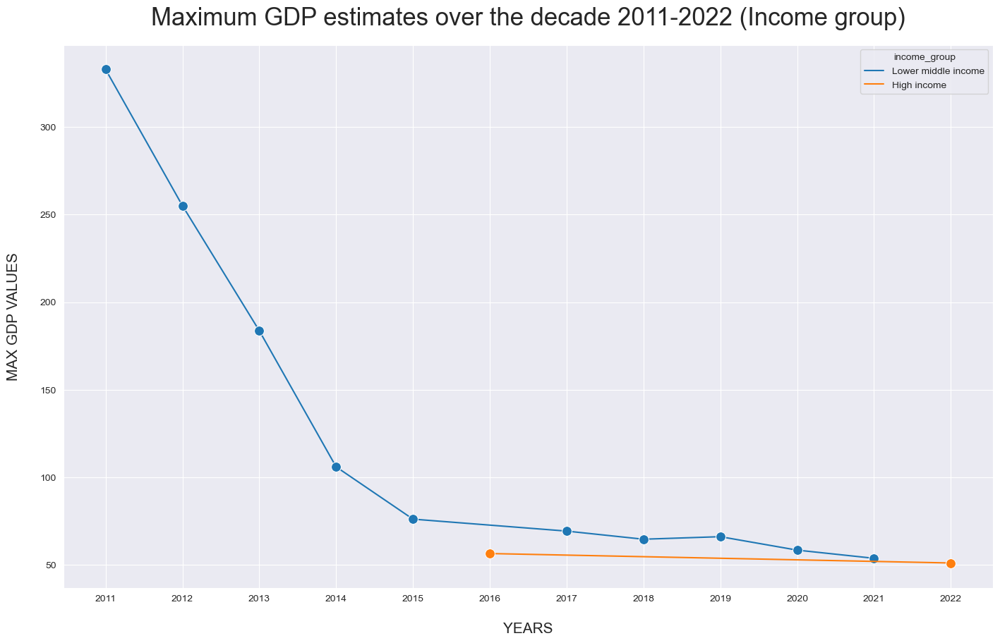

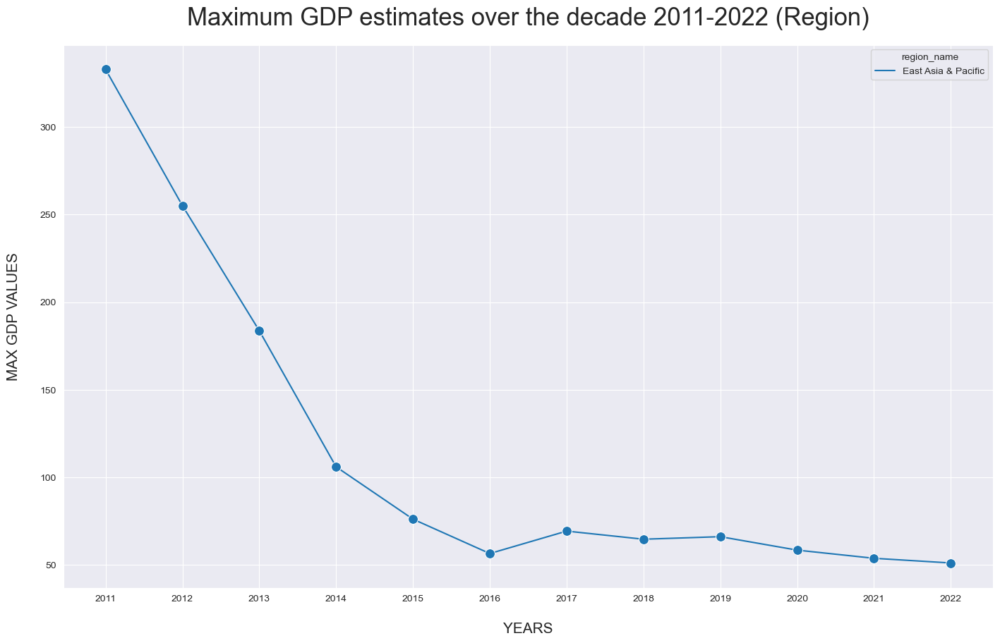

In [210]:
for i in range(1,6):
    # i = indicator
    df_indicator = df_sorted[df_sorted['indicator_id']==i]
    df_indicator = df_indicator.groupby(['year_'])[['gdp_value','country_code','country_name','income_group','region_name']].apply(lambda x: x.loc[x['gdp_value'].idxmax()])
    df_indicator['year'] = df_indicator.index
    df_indicator = df_indicator.reset_index(drop=True)
    plot_general_graphs(i,df_indicator)

### CONCLUSIONS:

<h3 style="color:green;">Indicator 1</h3>

#### (1) Pre-COVID period (1960-2018)

#### (2) COVID period (2019-2022) ???

<hr>

# Top 10 Years of performance (based in individual GDP over 1960-2022), for every Indicator

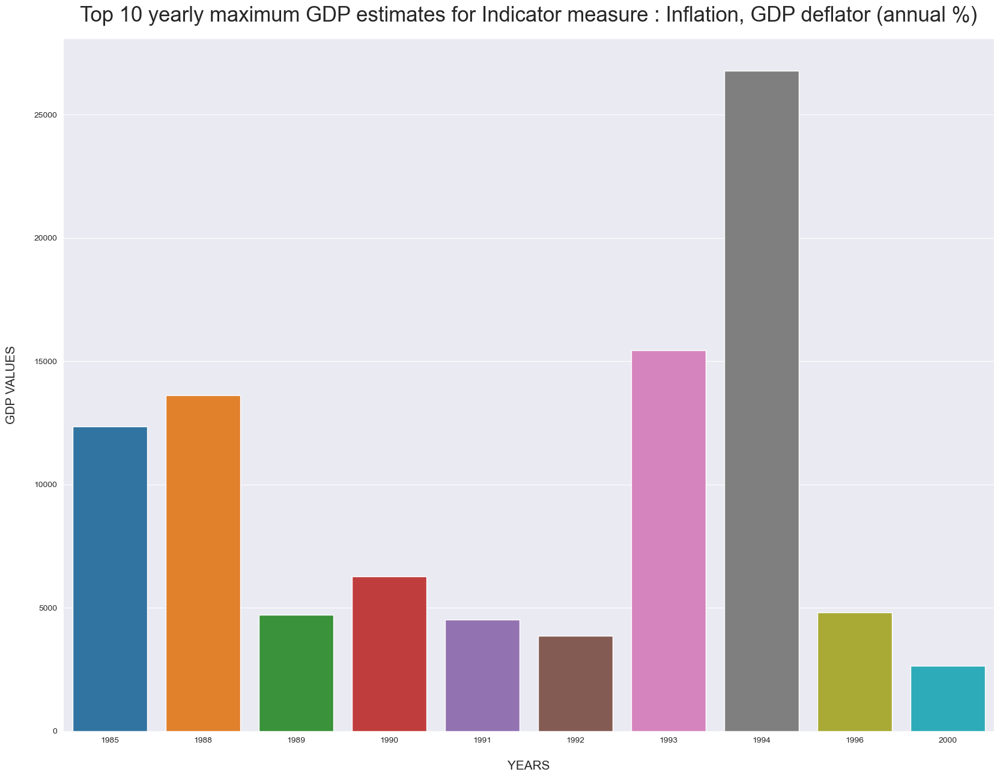

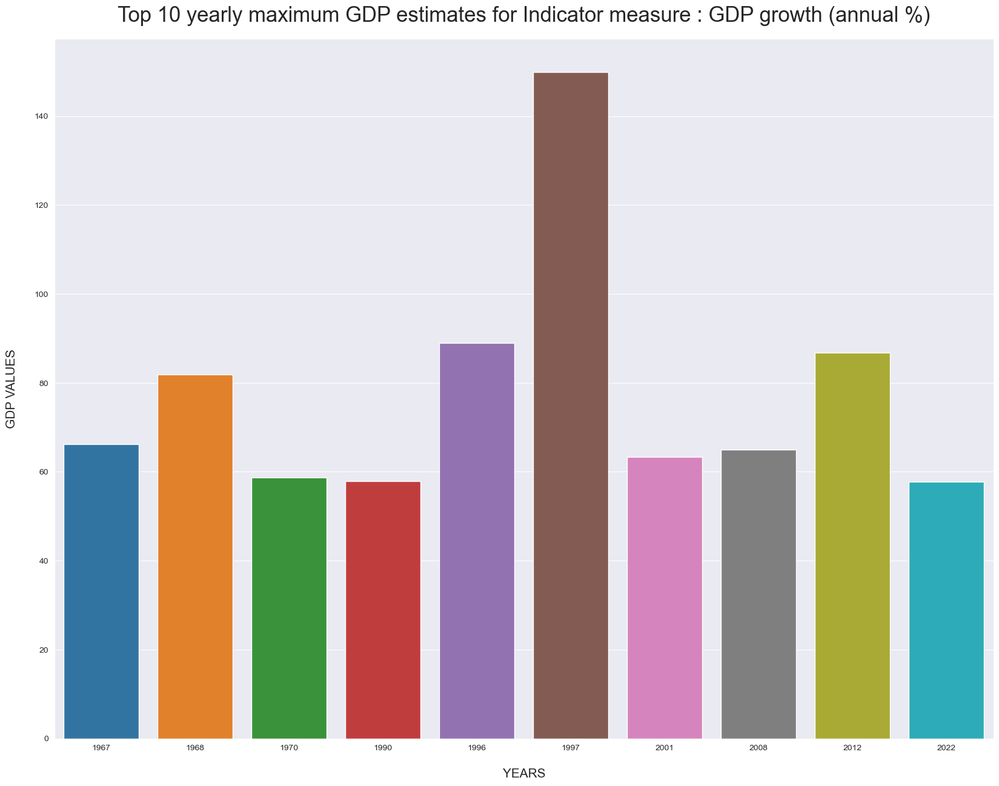

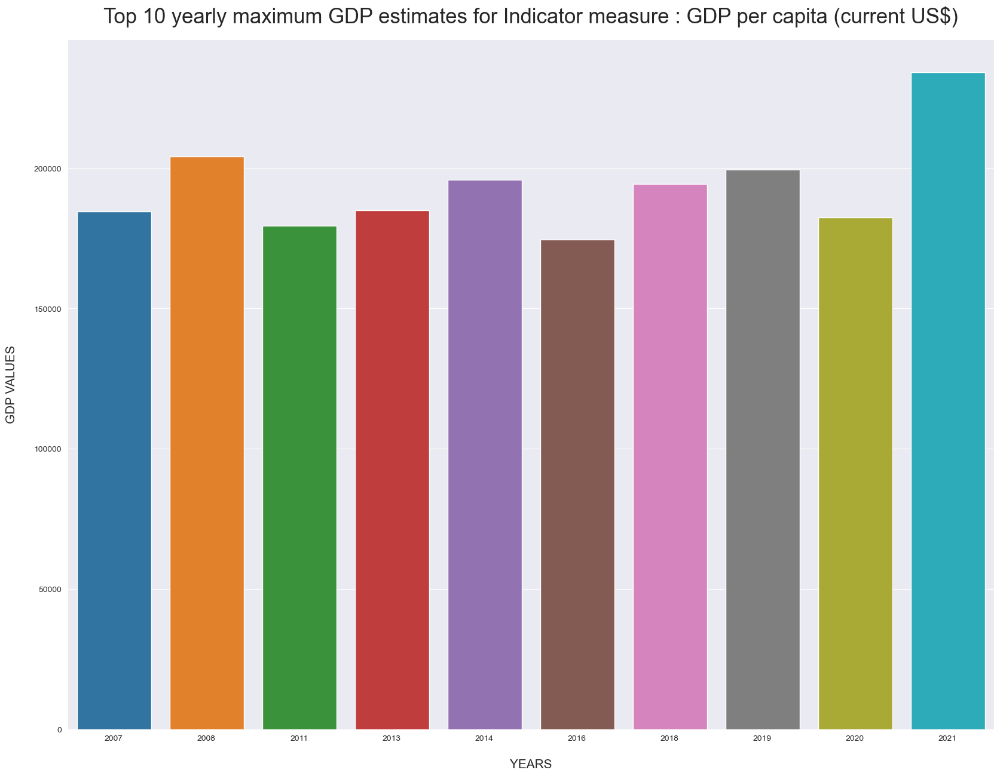

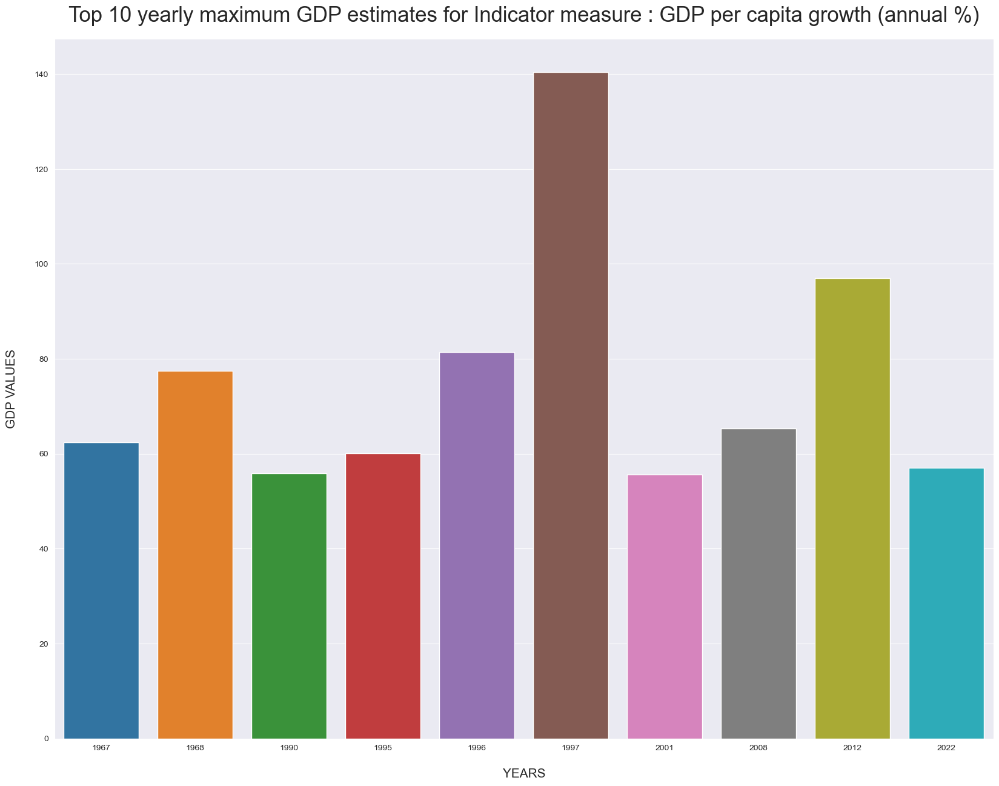

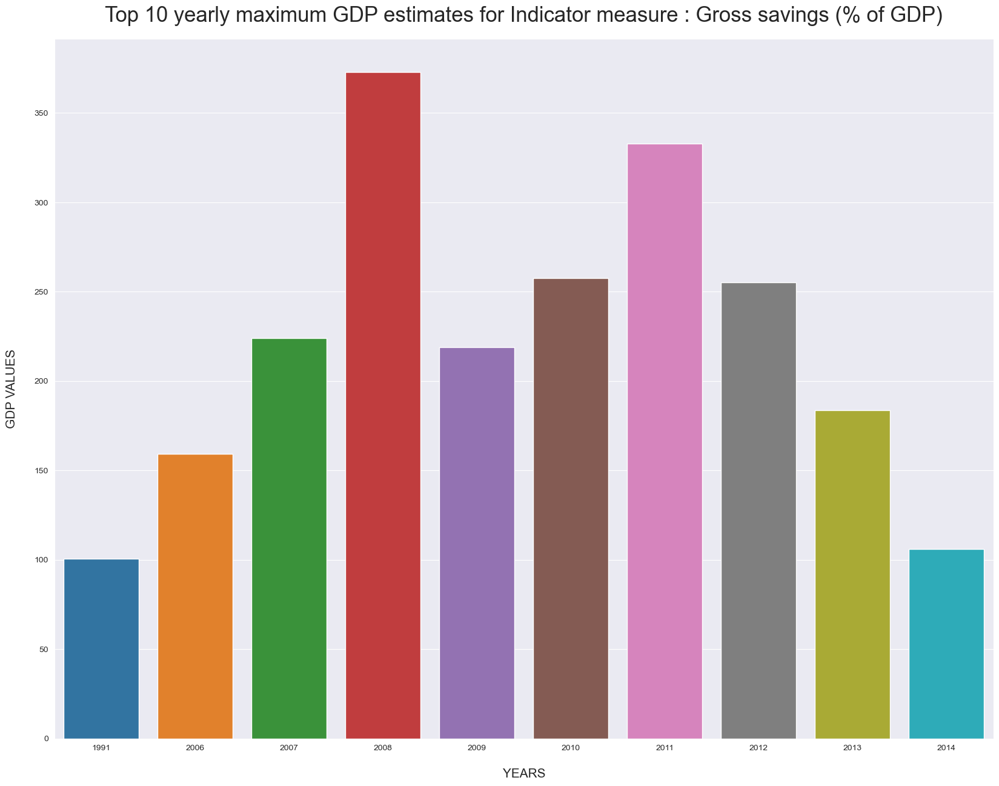

In [183]:
for i in range(1,6):
    year_wise_max_gdp = df[df['indicator_id']==i].groupby(['year_'])[['gdp_value']].max()
    year_wise_max_gdp = year_wise_max_gdp.sort_values(by=['gdp_value'],ascending=False)
    year_wise_max_gdp['year'] = year_wise_max_gdp.index
    year_wise_max_gdp = year_wise_max_gdp[0:10].sort_values(by=['year'])
    year_wise_max_gdp = year_wise_max_gdp.reset_index(drop=True)
    plt.figure(figsize=(20, 15))
    sns.barplot(data=year_wise_max_gdp,
           x='year',
           y='gdp_value')
    ind = (df_dim_indicator[df_dim_indicator['indicator_id']==i]['indicator_name']).to_string()[5:]
    plt.title(f'Top 10 yearly maximum GDP estimates for Indicator measure : {ind}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.show();
    

<hr>

### Trends of each region for each indicator

A performance analysis of GDP value of all countries over the years for a given region and indicator

In [185]:
regions = list(df_dim_regions['region_name'].unique())

In [186]:
merged_df_regions = pd.merge(merged_df,df_dim_regions,on='region_id')

In [187]:
regions_df = merged_df_regions[merged_df_regions['region_name'] == regions[0]]

In [192]:
# regions_df[regions_df['indicator_id']==1]

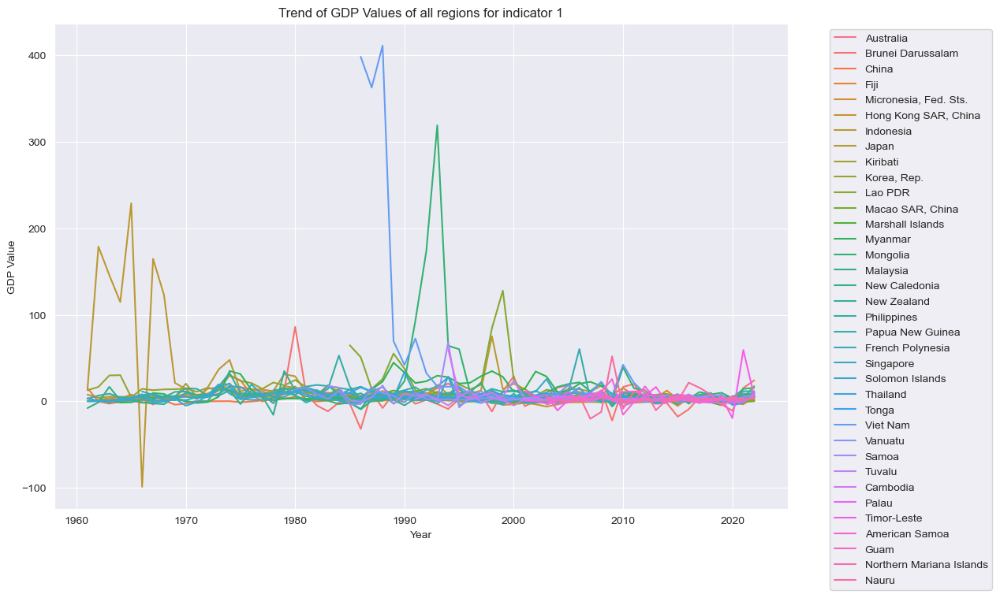

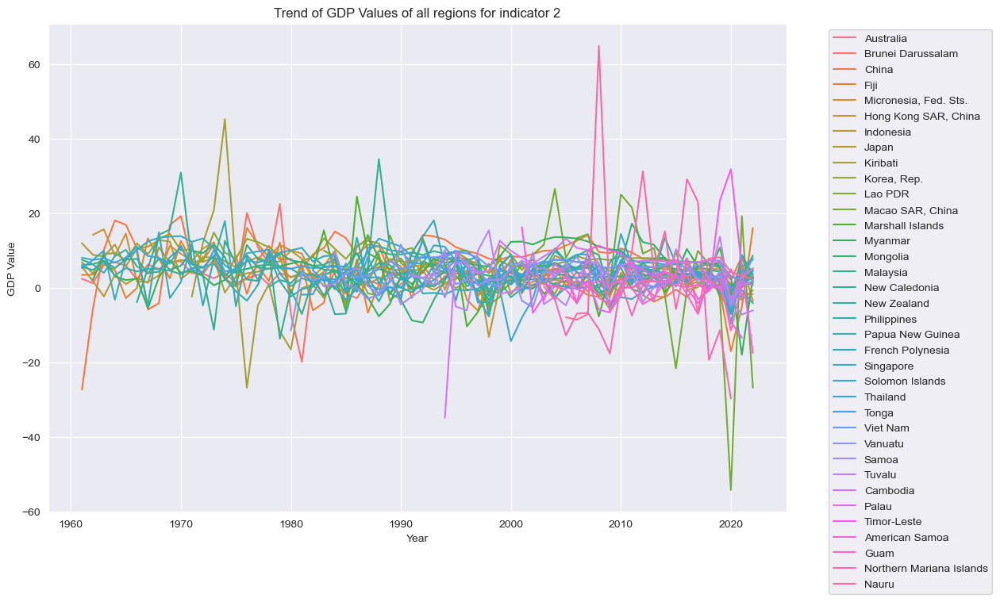

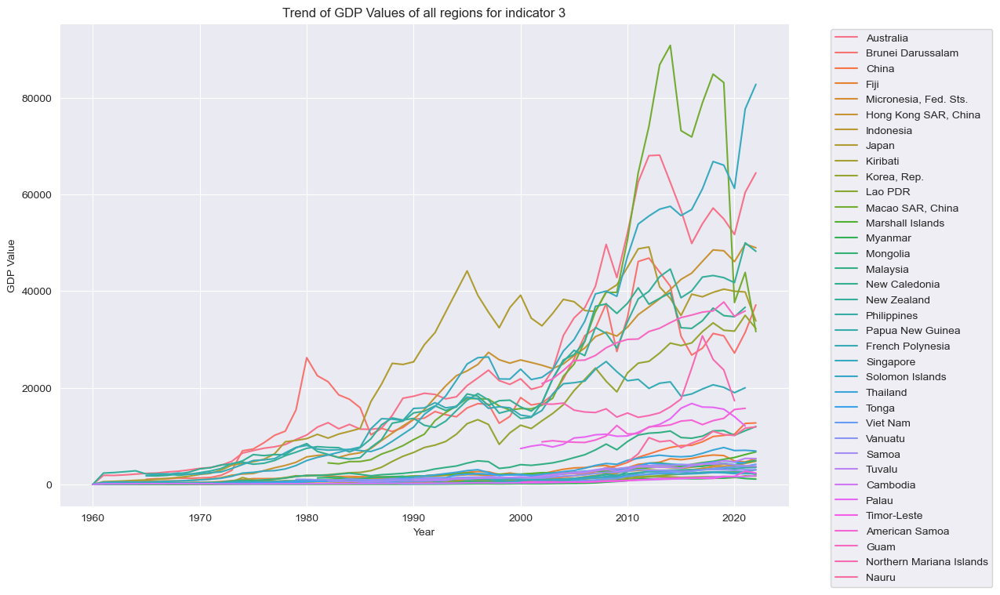

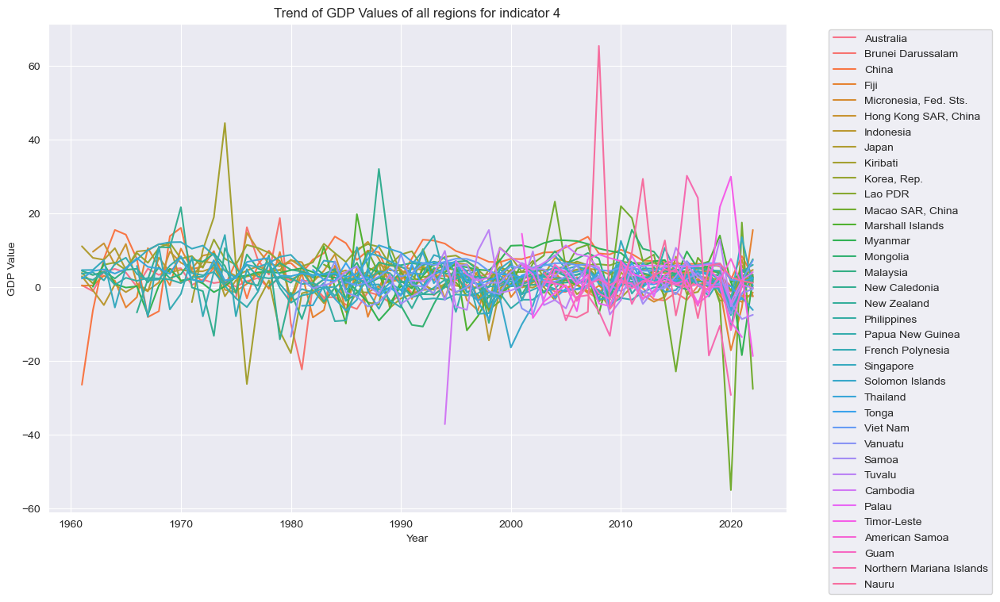

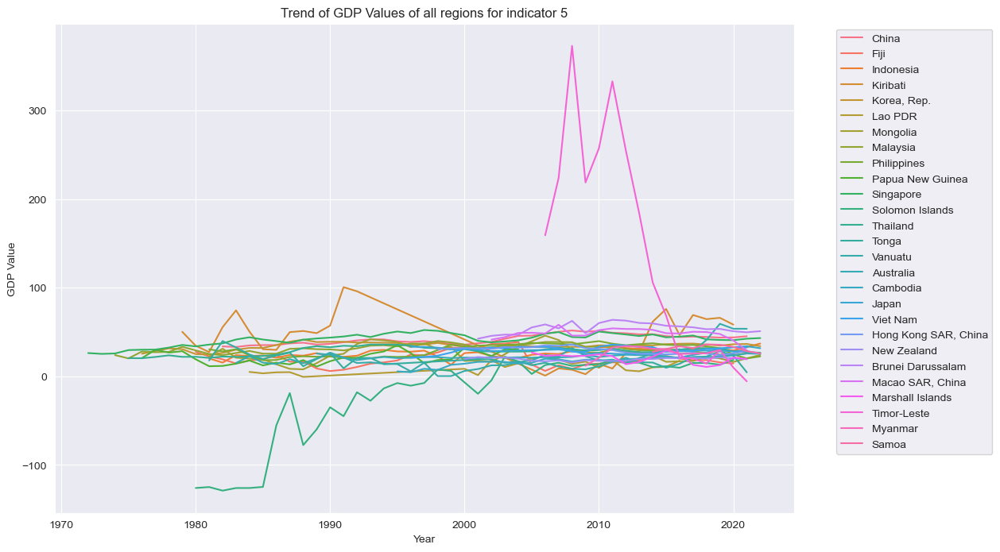

In [195]:
for i in range(1,6):
    plt.figure(figsize=(12,8))
    sns.lineplot(data=regions_df[regions_df['indicator_id']==i],
                x="year_",
                y="gdp_value",
                hue="country_name")
    plt.xlabel('Year')
    plt.ylabel('GDP Value')
    plt.title(f'Trend of GDP Values of all regions for indicator {i}')
    plt.legend(bbox_to_anchor=(1.05,1))
    plt.show();

# Report on a Country's performance

In [213]:
df_dim_country[['country_code','country_name']]

,country_code,country_name
0,ABW,Aruba
1,AFE,Africa Eastern and Southern
2,AFG,Afghanistan
3,AFW,Africa Western and Central
4,AGO,Angola
...,...,...
260,XKX,Kosovo
261,YEM,"Yemen, Rep."
262,ZAF,South Africa
263,ZMB,Zambia


In [328]:
# cc = input('Enter the country code : ')

In [327]:
def general_analysis(cc):
    r = df_dim_country[df_dim_country['country_code']==cc]
    country = r['country_name'][r.index[0]]
    for i in range(1,6):
        df_cc_gdp = df[(df['country_code']==cc)&(df['indicator_id']==i)].sort_values(by='gdp_value',ascending=False)
        # df_cc_ind
        #Maximum gdp value output over 1960-2022 by the country
        indicator = df_dim_indicator[df_dim_indicator['indicator_id']==i]['indicator_name'][i-1]
        gdp = df_cc_gdp['gdp_value'][df_cc_gdp.index[0]]
        y = df_cc_gdp['year_'][df_cc_gdp.index[0]]
        print(f'Indicator : {indicator}')
        print(f'Maximum GDP values achieved by {country} over 1960-2022 is {gdp} in the year {y}')
        print('\n\n')       

In [323]:
def describe_indicator_gdp(i,vals):
    if i==1 and vals < 0:
            #Inflation
            #negative
            print('The prices of goods and services decreased during this period. It was likely more challenging for the economy to manage and could have led to decrease in production, lower levels of investment and reduced economic growth')
    elif i==1 and vals > 0:
        #Inflation, positive
        print('The prices of goods and services produced increased during this period. This could result from several factors such as increased demand for goods and services, an increase in the cost of inputs such as wages, or changes in the exchange rate')

    elif i==2 and vals < 0:
        #GDP growth (annual %)
        print("The country's economy contracted during the given period. There was likely an economic downturn, characterized by reduced economic activity and could have resulted from factors such as recession, political instability, natural disaster, or pandemic")
    elif i==2 and vals > 0:
        #GDP growth (annual %), positive
        print("The country's economy expanded during this period. There was likely an increase in economic activity, such as production, consumption, investment, and exports, and could be a measure of the country's economic performance and progress.")
    elif i==5 and vals < 0:
        #
        print("The average economic output per person in the country was declining, which can indicate a recession or an economic downturn. Factors that can contribute to GDP per capita decline include natural disasters, political instability, and economic policies that negatively impact investment and productivity")
    elif i==5 and vals > 0:
        print("The average economic output per person in the country was increasing, which implies that people in the country are becoming more prosperous. Factors that can contribute to GDP per capita growth include increases in productivity, investments, exports, and new business opportunities")

In [324]:
def average_gdp_during_covid(cc):
    r = df_dim_country[df_dim_country['country_code']=='ABW']
    country = r['country_name'][r.index[0]]
    for i in range(1,6):
        df_cc_gdp = df[(df['country_code']==cc)&(df['indicator_id']==i)].sort_values(by='gdp_value',ascending=False)
        # df_cc_ind
        #Maximum gdp value output over 1960-2022 by the country
        indicator = df_dim_indicator[df_dim_indicator['indicator_id']==i]['indicator_name'][i-1]
        vals = df[(df['country_code']==cc)&(df['indicator_id']==i)&((df['year_']==2019)|(df['year_']==2020)|(df['year_']==2021)|(df['year_']==2022))]['gdp_value']
        vals = vals.sum()/len(vals)
        vals
        print(f'Indicator : {indicator}')
        print(f'Average GDP estimate achieved by {country} during COVID period is {vals}')
        describe_indicator_gdp(i,vals)
        print('\n\n')

In [342]:
def country_report():
    country_c = input('Enter the country code : ')
    general_analysis(country_c)
    
    #Country's position in terms of GDP
    print("\n=====================================================================\n")
    print('COVID ANALYSIS')
    average_gdp_during_covid(cc)
    print("\n=====================================================================\n")
    
    #Country's trend
        
    #Comparision with another country
    
    
    
    #Country's trend
    country_trend(country_c)

Enter the country code : ABW
Indicator : Inflation, GDP deflator (annual %)
Maximum GDP values achieved by Aruba over 1960-2022 is 6.592950502 in the year 1998



Indicator : GDP growth (annual %)
Maximum GDP values achieved by Aruba over 1960-2022 is 18.64864865 in the year 1988



Indicator : GDP per capita (current US$)
Maximum GDP values achieved by Aruba over 1960-2022 is 31902.76258 in the year 2019



Indicator : GDP per capita growth (annual %)
Maximum GDP values achieved by Aruba over 1960-2022 is 18.86627814 in the year 1988



Indicator : Gross savings (% of GDP)
Maximum GDP values achieved by Aruba over 1960-2022 is 30.95600677 in the year 1995





COVID ANALYSIS
Indicator : Inflation, GDP deflator (annual %)
Average GDP estimate achieved by Aruba during COVID period is -0.12538670100000004
The prices of goods and services decreased during this period. It was likely more challenging for the economy to manage and could have led to decrease in production, lower levels of inv

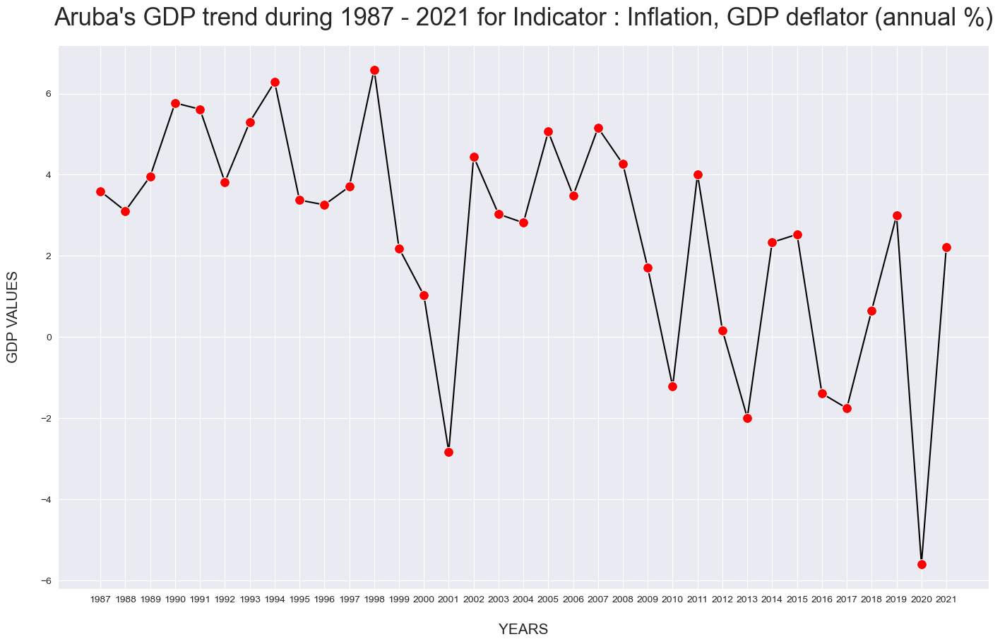

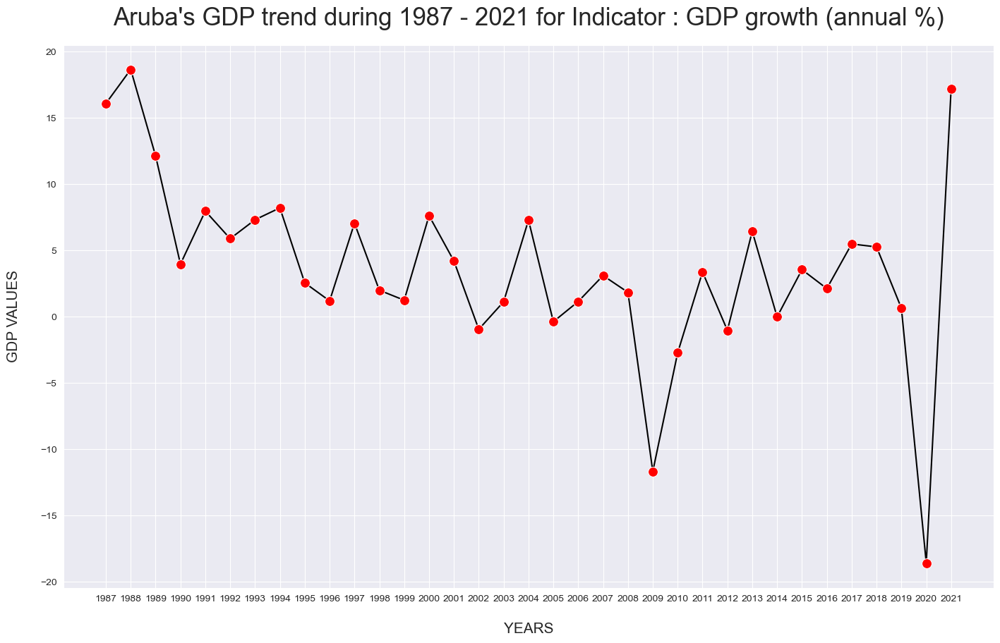

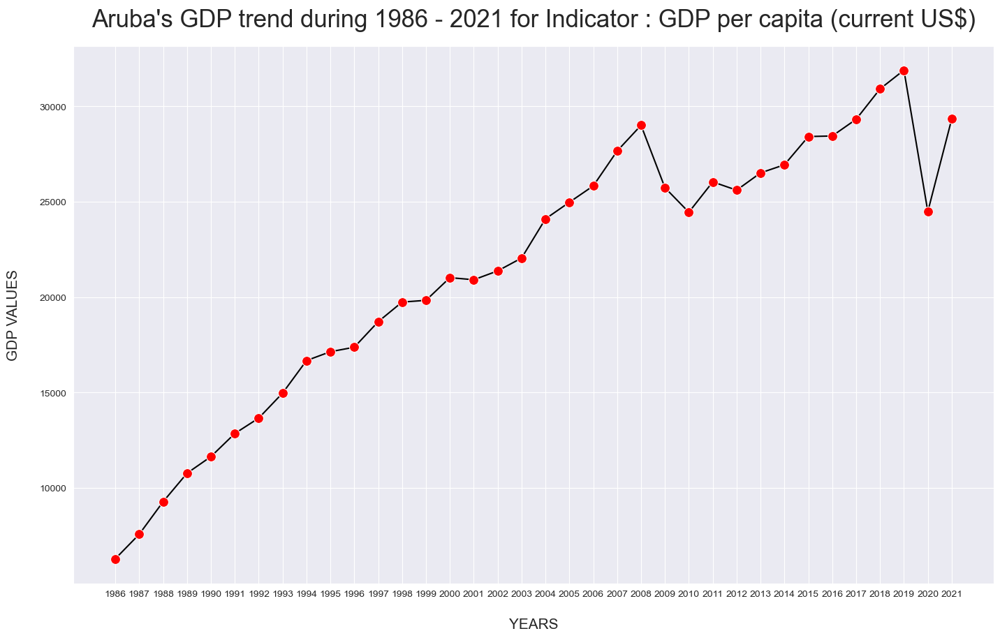

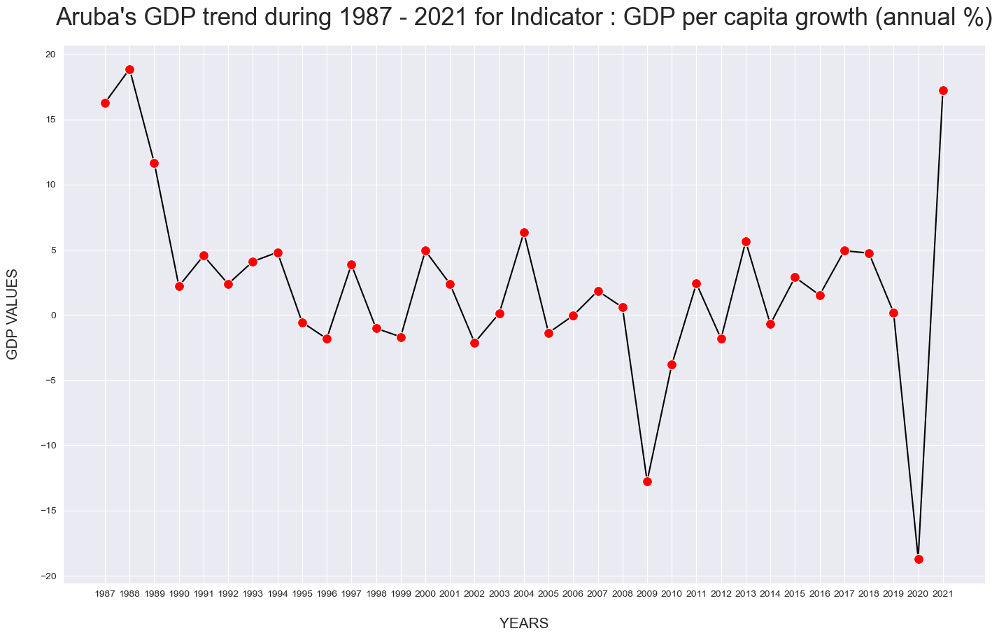

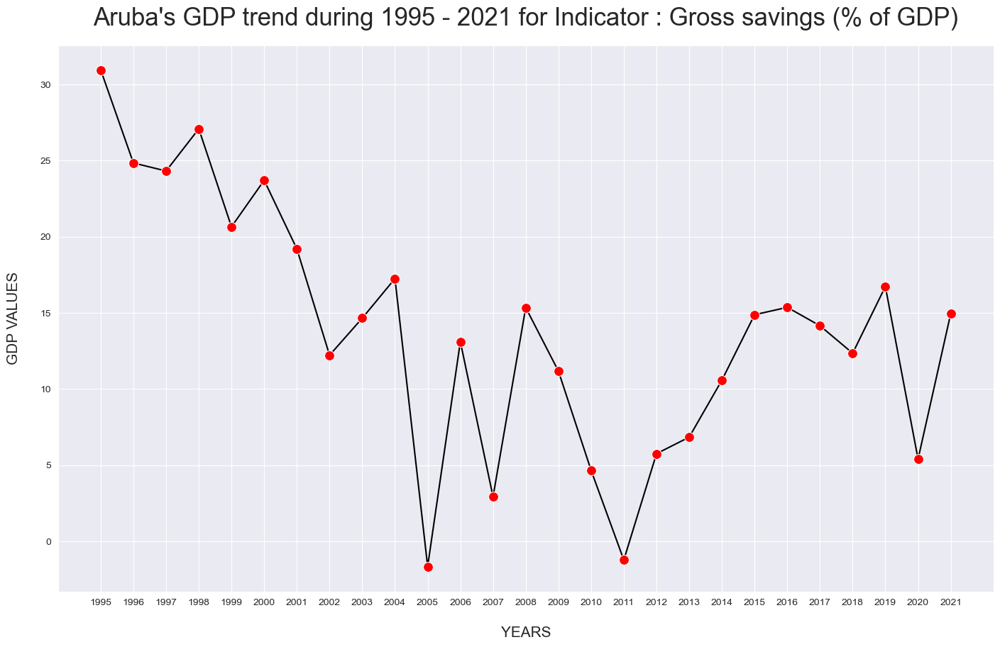

In [343]:
country_report()

In [ ]:
def countries_compare(cc1,cc2):
    

In [326]:
def comparitive_indicators_gdp(i,vals1,vals2,country1,country2):
    vals = vals1-vals2
    if i==3 and vals < 0:
        print(f'The overall economic standard of living in a {country2} is better than in {country1}')
    elif i==3 and vals > 0:
        print(f'The overall economic standard of living in a {country1} is better than in {country2}')
        
    elif i==4 and vals < 0:
        print(f'{country1} has lesser investment in the economy as more income is spent on current needs while compared to {country2}')
    elif i==4 and vals > 0:
        print(f"{country1} has a strong economy, with individuals and governments saving and reinvesting a large proportion of their income as compared to {country2}")

In [215]:
#Country's trend
#Comparision of country's trend, where it stands within the income group, within the region, indicator-wise, time period trend

In [275]:
df_cc_ind = df[(df['country_code']==cc)&(df['indicator_id']==1)].sort_values(by='gdp_value',ascending=False)
# df_cc_ind
#Maximum gdp value output over 1960-2022 by the country
print(df_cc_ind['gdp_value'][df_cc_ind.index[0]])
print(df_cc_ind['year_'][df_cc_ind.index[0]])

6.592950502
1998


In [272]:
df_cc_ind

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
8774,12,1,39,3.0,1.0,1,6.592951,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,1998
5352,8,1,35,3.0,1.0,1,6.287975,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,1994
2193,4,1,31,3.0,1.0,1,5.769870,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,1990
2956,5,1,32,3.0,1.0,1,5.614860,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,1991
4540,7,1,34,3.0,1.0,1,5.300314,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,1993
17105,21,1,48,3.0,1.0,1,5.157937,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,2007
15184,19,1,46,3.0,1.0,1,5.062491,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,2005
12363,16,1,43,3.0,1.0,1,4.446604,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,2002
18076,22,1,49,3.0,1.0,1,4.264063,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,2008
21020,25,1,52,3.0,1.0,1,4.011814,ABW,Aruba,High income,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",Latin America & Caribbean,2011


### Country's overall GDP performance over 1960-2022

In [334]:
def plot_country_trend(df_cc_ind,ind):
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=df_cc_ind,
                 x="year_",
                 y="gdp_value",
                 marker='o',
                 markersize=10,
                 color='black',
                 markerfacecolor='red'
            )
    record = df_dim_country[df_dim_country['country_code']==cc]['country_name']
    country = record[record.index[0]]
    indicator = df_dim_indicator[df_dim_indicator['indicator_id']==ind]['indicator_name'][ind-1]
    plt.title(f"{country}'s GDP trend during {df_cc_ind.year_.min()} - {df_cc_ind.year_.max()} for Indicator : {indicator}", fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(df_cc_ind.year_)
    plt.show();

In [341]:
def country_trend(cc):
    for i in range(1,6):
        indicator = df_dim_indicator[df_dim_indicator['indicator_id']==i]['indicator_name'][i-1]
        df_cc_ind = df[(df['country_code']==cc)&(df['indicator_id']==i)]
        df_cc_trend = df_cc_ind.sort_values(by='year_')
        plot_country_trend(df_cc_trend,i)

------------------

### FUTURE

- How different increase in certain income groups affects the average gdp values overtime
